# **Detection of Thoracic Diseases Using Chest X-Ray Images and Convolutional Neural Networks**

<a id="1"></a>
# 1. Dataset : 
1. 1 [NIH Chest X-rays](https://www.kaggle.com/datasets/nih-chest-xrays/data/data)

In [1]:
# sample code links
# 1. https://www.kaggle.com/code/paultimothymooney/predicting-pathologies-in-x-ray-images
# 2. https://www.kaggle.com/code/kmader/train-simple-xray-cnn

<a id="2"></a>
#  2. Install required packages

In [2]:
# for new conda env excep keggle Machine config
# !pip install --upgrade pip
# !pip install ipywidgets
# !pip install pydot



# # only keggle 
# !sudo apt-get update
# !sudo apt-get install libgl1-mesa-glx
# !apt-get update
# !apt-get install -y libgl1-mesa-glx

!pip install wandb
# !pip install tensorflow[and-cuda]

# !pip uninstall -y tensorboard tb-nightly && pip install tb-nightly  

# !pip install tensorflow tensorflow-addons


!pip install pandarallel

!pip install tabulate

!pip install ipywidgets --upgrade

!pip install --unstable-feature=resolver

!pip check

  Preparing metadata (setup.py) ... - done
  Created wheel for pandarallel: filename=pandarallel-1.6.5-py3-none-any.whl size=16672 sha256=998e7591e40efdb3e252f4566b3a12d47eabad1aa6fb28dcfc86e55ece5af637
  Stored in directory: /root/.cache/pip/wheels/50/4f/1e/34e057bb868842209f1623f195b74fd7eda229308a7352d47f
Successfully built pandarallel
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 139.8/139.8 kB 3.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 214.4/214.4 kB 8.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.3/2.3 MB 25.4 MB/s eta 0:00:00
  Attempting uninstall: widgetsnbextension
    Found existing installation: widgetsnbextension 3.6.6
    Uninstalling widgetsnbextension-3.6.6:
      Successfully uninstalled widgetsnbextension-3.6.6
  Attempting uninstall: jupyterlab-widgets
    Found existing installation: jupyterlab-widgets 3.0.9
    Uninstalling jupyterlab-widgets-3.0.9:
      Successfully uninstalled jupyterlab-widgets-3.0.9
  Attempting uninsta

<a id="3"></a>
# 3. Import required packages

In [3]:
import sys
import platform

import os
os.environ["KERAS_BACKEND"] = "tensorflow"
from glob import glob

import shutil
import ast
import json
import glob
import random
import collections
import gc
import datetime
import pytz
timezone = pytz.timezone("Asia/Colombo")

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

import cv2
import matplotlib.gridspec as gridspec
import math
import zlib
import itertools
import time
import matplotlib.pyplot as plt
import matplotlib.cm as cm

import seaborn as sns

# ml libs
import tensorflow as tf

import keras

from sklearn.model_selection import train_test_split
from sklearn.utils import shuffle
# for model validation
from sklearn import metrics
from sklearn.metrics import accuracy_score, average_precision_score, balanced_accuracy_score, classification_report, confusion_matrix, ConfusionMatrixDisplay, f1_score, precision_recall_fscore_support, precision_score, recall_score, roc_auc_score


# import tensorflow_hub as hub
from tensorflow import keras
from keras import layers
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.utils import to_categorical, plot_model
from tensorflow.keras.metrics import AUC
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import Activation, concatenate, Conv2D, Dense, Dropout, Flatten, Input, InputLayer, MaxPooling2D, ZeroPadding2D, LayerNormalization,BatchNormalization
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau
from tensorflow.keras.preprocessing import image

# data print like table 
from tabulate import tabulate


import ipywidgets as widgets
import io

from PIL import Image

import tqdm
from tqdm.notebook import tqdm; tqdm.pandas(); # get nice bar

from pandarallel import pandarallel; 
pandarallel.initialize(); 

import multiprocessing
multiprocessing.set_start_method('spawn', force=True)

os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'  # or '3' to show only errors


# Seed for reproducability
seed = 1234
np.random.seed(seed)
# Make numpy printouts easier to read.
np.set_printoptions(precision=3, suppress=True)

def working_dir_clean():
    list_all_file=os.listdir("./")
    for file_name in list_all_file:
        try:
            shutil.rmtree("./"+file_name)
            print(f"Remove File Name : {file_name}")
        
        except Exception as e:
            print('Exception:',e)
                    #if any exception rasied, the exception will be printed here. And pass to the next image
        
working_dir_clean()

# getCurrentTime formated way
def getNowDateTime():
    # Get current date and time
    now = datetime.datetime.now()

    # Format the date and time with desired separators
    formatted_time = now.strftime("%Y-%m-%d-%H-%M-%S")
    
    return formatted_time

# Clear previous session
tf.keras.backend.clear_session()

import warnings
warnings.filterwarnings('ignore')

def clean_keras_wandb():
    print("Cleaning up resources...")
    try:
        # Remove checkpoint files
        checkpoint_files = [f for f in os.listdir('.') if f.startswith('propose.') and f.endswith('.keras')]
        for f in checkpoint_files:
            os.remove(f)
        
        # Remove logs directory
        shutil.rmtree(log_dir)
        
        # Remove .wandb directory
        shutil.rmtree('.wandb')
        
        # Remove saved model (optional)
        os.remove(name)
    except Exception as e:
        print(f"Cleanup error: {e}")

2025-02-28 07:42:00.792060: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2025-02-28 07:42:00.792190: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2025-02-28 07:42:00.929570: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


INFO: Pandarallel will run on 2 workers.
INFO: Pandarallel will use Memory file system to transfer data between the main process and workers.
Exception: [Errno 20] Not a directory: './__notebook__.ipynb'


In [4]:
import tensorflow as tf

gpus = tf.config.experimental.list_physical_devices('GPU')
if gpus:
    try:
        for gpu in gpus:
            tf.config.experimental.set_memory_growth(gpu, True)
        logical_gpus = tf.config.experimental.list_logical_devices('GPU')
        print(len(gpus), "Physical GPUs,", len(logical_gpus), "Logical GPUs")
    except RuntimeError as e:
    # Memory growth must be set before GPUs have been initialized
        print(e)

1 Physical GPUs, 1 Logical GPUs


<a id="4"></a>
# 4. TensorBoard and WanDB related code 

In [5]:
# Clear any logs from previous wandb_runs
!rm -rf ./logs/ 
!mkdir ./logs/

# secrete import from keggle store
from kaggle_secrets import UserSecretsClient

user_secrets = UserSecretsClient()

secret_value_0 = user_secrets.get_secret("auth")

# Run tensorboard
import os
import multiprocessing


pool = multiprocessing.Pool(processes = 10)
results_of_processes = [pool.apply_async(os.system, args=(cmd, ), callback = None )
                        for cmd in [f"tensorboard --logdir ./logs/ --load_fast true --host 0.0.0.0 --port 5006 &"]]

<a id="5"></a>
# 5. Common Configuration for Current Phase

In [6]:
def get_image_details(image_path):
    # Open the image
    image = Image.open(image_path)

    # Get image size (width and height)
    width, height = image.size

    # Get image storage size in bytes
    storage_size = os.path.getsize(image_path)

    # Convert storage size to MB
    storage_size_mb = storage_size / (1024 * 1024)

    print("Image width:", width)
    print("Image height:", height)
    print("Image storage size (MB):", storage_size_mb)
    

    
# Open the image file
image_path = '/kaggle/input/data/images_005/images/00009234_002.png'
get_image_details(image_path)

Image width: 1024
Image height: 1024
Image storage size (MB): 0.3376502990722656


In [7]:
# This project name should be taken from the wandb
wandb_project_name = "detection_of_thoracic_diseases_using_chest_x-ray"
image_size = 224
batch_size = 32
epochs_count = 100
num_classes = 15
learning_rate = 0.001

<a id="6"></a>
# 6. Image paths stores to array

### Load the data 

In [8]:
all_xray_df = pd.read_csv('/kaggle/input/data/Data_Entry_2017.csv')
all_xray_df.head(5)

,Image Index,Finding Labels,Follow-up #,Patient ID,Patient Age,Patient Gender,View Position,OriginalImage[Width,Height],OriginalImagePixelSpacing[x,y],Unnamed: 11
0,00000001_000.png,Cardiomegaly,0,1,58,M,PA,2682,2749,0.143,0.143,NaN
1,00000001_001.png,Cardiomegaly|Emphysema,1,1,58,M,PA,2894,2729,0.143,0.143,NaN
2,00000001_002.png,Cardiomegaly|Effusion,2,1,58,M,PA,2500,2048,0.168,0.168,NaN
3,00000002_000.png,No Finding,0,2,81,M,PA,2500,2048,0.171,0.171,NaN
4,00000003_000.png,Hernia,0,3,81,F,PA,2582,2991,0.143,0.143,NaN


In [9]:
# Correctly use the glob function
image_paths = glob.glob('/kaggle/input/data/images*/*/*.png')

# Create a dictionary with basename as the key and full path as the value
all_image_paths = {os.path.basename(path): path for path in image_paths}

# Assuming you have the DataFrame `all_xray_df` defined somewhere above
print('Scans found:', len(all_image_paths), ', Total Headers:', all_xray_df.shape[0])

Scans found: 112120 , Total Headers: 112120


In [10]:
# Ensure 'Patient Age' is an integer
all_xray_df['Patient Age'] = all_xray_df['Patient Age'].astype(int)
# Map 'Image Index' to paths
all_xray_df['path'] = all_xray_df['Image Index'].map(all_image_paths.get)

# Sample 3 random rows
all_xray_df.sample(3)


,Image Index,Finding Labels,Follow-up #,Patient ID,Patient Age,Patient Gender,View Position,OriginalImage[Width,Height],OriginalImagePixelSpacing[x,y],Unnamed: 11,path
19981,00005345_000.png,No Finding,0,5345,50,M,AP,2500,2048,0.171,0.171,NaN,/kaggle/input/data/images_003/images/00005345_...
63487,00015658_019.png,Atelectasis,19,15658,52,M,PA,2992,2991,0.143,0.143,NaN,/kaggle/input/data/images_007/images/00015658_...
80161,00019704_002.png,No Finding,2,19704,20,M,PA,2992,2991,0.143,0.143,NaN,/kaggle/input/data/images_009/images/00019704_...


# Preprocessing Labels
Here we take the labels and make them into a more clear format. The primary step is to see the distribution of findings and then to convert them to simple binary labels

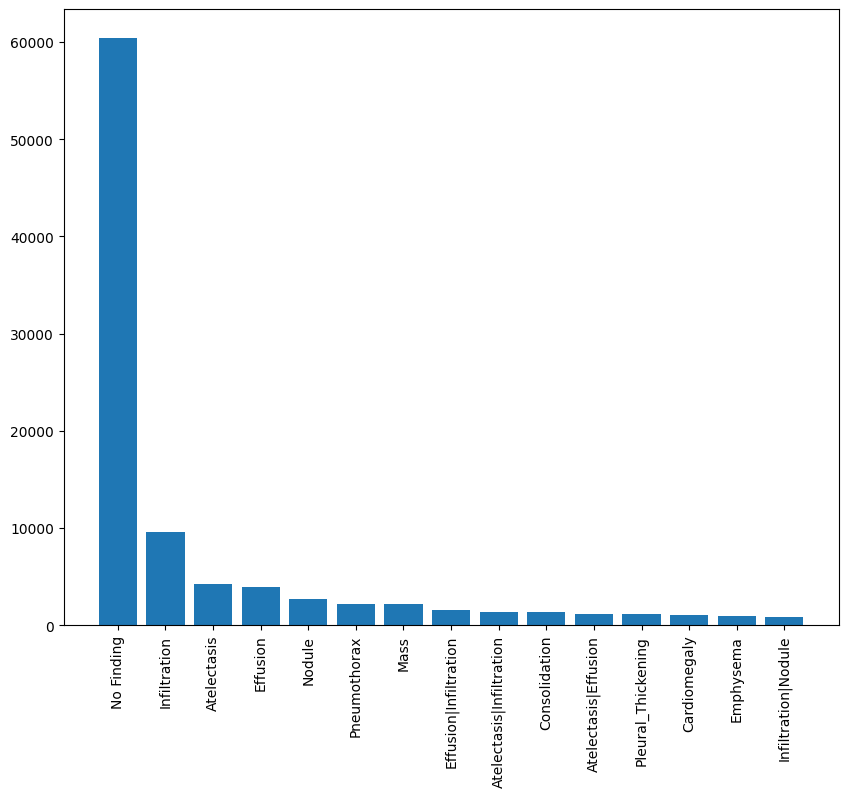

In [11]:
label_counts = all_xray_df['Finding Labels'].value_counts()[:15]
fig, ax1 = plt.subplots(1,1,figsize = (10, 8))
ax1.bar(np.arange(len(label_counts))+0.5, label_counts)
ax1.set_xticks(np.arange(len(label_counts))+0.5)
_ = ax1.set_xticklabels(label_counts.index, rotation = 90)

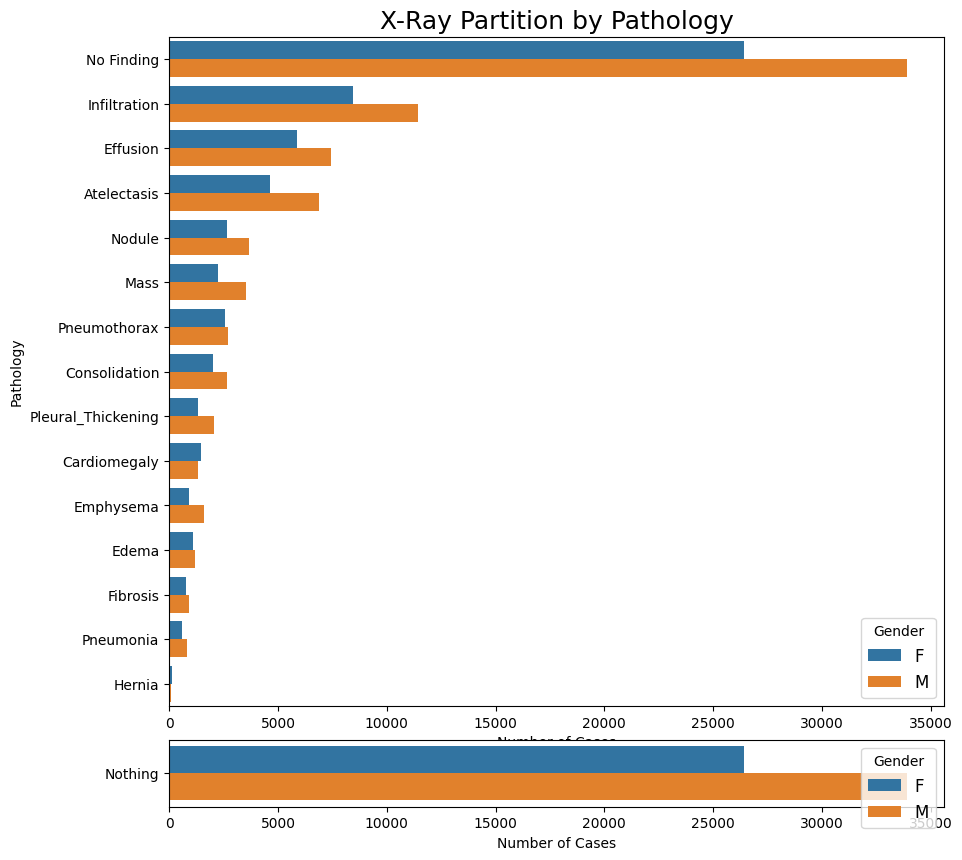

In [12]:
# Drop unused columns and create an independent copy
labels = all_xray_df[['Image Index', 'Finding Labels', 'Follow-up #', 'Patient ID', 'Patient Age', 'Patient Gender']].copy()

# Define the pathology list
pathology_list = ['Atelectasis', 'Cardiomegaly', 'Consolidation', 'Edema', 'Effusion', 'Emphysema', 'Fibrosis',
                  'Hernia', 'Infiltration', 'Mass', 'No Finding', 'Nodule', 'Pleural_Thickening', 'Pneumonia', 'Pneumothorax']

# Create new columns for each pathology
for pathology in pathology_list:
    labels.loc[:, pathology] = labels['Finding Labels'].apply(lambda x: 1 if pathology in x else 0)

# Convert 'Patient Age' to integer
labels['Patient Age'] = labels['Patient Age'].astype(int)

plt.figure(figsize=(10, 10))
gs = gridspec.GridSpec(8, 1)
ax1 = plt.subplot(gs[:7, :])
ax2 = plt.subplot(gs[7, :])

# Reshape data for pathology count
data1 = pd.melt(labels, id_vars=['Patient Gender'], value_vars=pathology_list, var_name='Category', value_name='Count')
data1 = data1.loc[data1.Count > 0]

# Aggregate counts per category and gender
data1_grouped = data1.groupby(['Category', 'Patient Gender']).size().reset_index(name='Total')

# Bar plot for different pathologies
sns.barplot(y='Category', x='Total', hue='Patient Gender', data=data1_grouped, ax=ax1,
            order=data1_grouped.groupby('Category')['Total'].sum().sort_values(ascending=False).index)
ax1.set(xlabel="Number of Cases", ylabel="Pathology")
ax1.legend(title="Gender", fontsize=12)
ax1.set_title('X-Ray Partition by Pathology', fontsize=18)

# Create a column for "No Finding"
labels.loc[:, 'Nothing'] = labels['Finding Labels'].apply(lambda x: 1 if 'No Finding' in x else 0)

data2 = pd.melt(labels, id_vars=['Patient Gender'], value_vars=['Nothing'], var_name='Category', value_name='Count')
data2 = data2.loc[data2.Count > 0]

# Aggregate counts per category and gender for 'No Finding'
data2_grouped = data2.groupby(['Category', 'Patient Gender']).size().reset_index(name='Total')

# Bar plot for "No Finding"
sns.barplot(y='Category', x='Total', hue='Patient Gender', data=data2_grouped, ax=ax2)
ax2.set(xlabel="Number of Cases", ylabel="")
ax2.legend(title="Gender", fontsize=12)

plt.subplots_adjust(hspace=0.5)
plt.show()


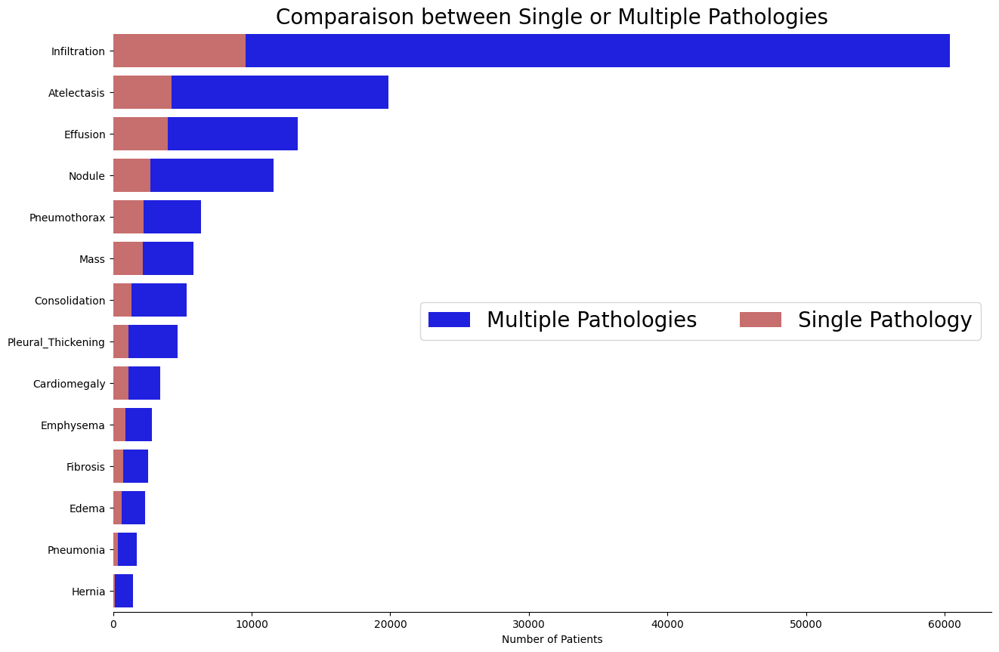

In [13]:
df=labels
data=df.groupby('Finding Labels').count().sort_values('Patient ID',ascending=False)
df1=data[['|' in index for index in data.index]].copy()
df2=data[['|' not in index for index in data.index]]
df2=df2[['No Finding' not in index for index in df2.index]]
df2['Finding Labels']=df2.index.values
df1['Finding Labels']=df1.index.values

f, ax = plt.subplots(sharex=True,figsize=(15, 10))
g=sns.countplot(y='Category',data=data1, ax=ax, order = data1['Category'].value_counts().index,color='b',label="Multiple Pathologies")
sns.set_color_codes("muted")
g=sns.barplot(x='Patient ID',y='Finding Labels',data=df2, ax=ax, color="r",label="Single Pathology")
ax.legend(ncol=2, loc="center right", frameon=True,fontsize=20)
ax.set( ylabel="",xlabel="Number of Patients")
ax.set_title("Comparaison between Single or Multiple Pathologies",fontsize=20)      
sns.despine(left=True)

In [14]:
# 1. Read the original CSV
csv_path = "/kaggle/input/data/Data_Entry_2017.csv"
df = pd.read_csv(csv_path)

# 2. Split multi-label strings into lists
#    Example: "Pneumothorax|Pneumonia" -> ["Pneumothorax", "Pneumonia"]
df['Finding Labels'] = df['Finding Labels'].apply(lambda x: x.split('|') if isinstance(x, str) else [])
df.replace([np.inf, -np.inf], np.nan, inplace=True)
df.fillna(0, inplace=True)

# 3. Explode the DataFrame to get one label per row
df_exploded = df.explode('Finding Labels')

# 4. Print some info
print(f"Original dataset size: {len(df)}")
print(f"Exploded dataset size: {len(df_exploded)}")

Original dataset size: 112120
Exploded dataset size: 141537


In [15]:
# 5. Use glob to get all image paths
image_paths = glob.glob("/kaggle/input/data/images*/*/*.png")

# 6. Create a dictionary with {basename: full_path}
all_image_paths = {os.path.basename(path): path for path in image_paths}

# 7. Add a 'full_path' column to df_exploded
df_exploded['full_path'] = df_exploded['Image Index'].map(all_image_paths)

# 8. Print a few rows to check
print(df_exploded[['Image Index', 'Finding Labels', 'full_path']].head())


TensorBoard 2.15.1 at http://0.0.0.0:5006/ (Press CTRL+C to quit)


        Image Index Finding Labels  \
0  00000001_000.png   Cardiomegaly   
1  00000001_001.png   Cardiomegaly   
1  00000001_001.png      Emphysema   
2  00000001_002.png   Cardiomegaly   
2  00000001_002.png       Effusion   

                                           full_path  
0  /kaggle/input/data/images_001/images/00000001_...  
1  /kaggle/input/data/images_001/images/00000001_...  
1  /kaggle/input/data/images_001/images/00000001_...  
2  /kaggle/input/data/images_001/images/00000001_...  
2  /kaggle/input/data/images_001/images/00000001_...  


<a id="7"></a>
# 7. Data set creation *Balance* and *Inbalance* 

In [16]:
# 9. Count the number of images per label
label_counts = df_exploded['Finding Labels'].value_counts()
min_count = label_counts.min()
print(label_counts)
print(f"Smallest class has {min_count} images.")

# 10. Under-sample each class to match the smallest class size
cols = df_exploded.columns
df_balanced = (df_exploded.groupby("Finding Labels", group_keys=False)[cols].apply(lambda x: x.sample(min_count, random_state=42)).reset_index(drop=True))


print(f"Balanced dataset size: {len(df_balanced)}")

Finding Labels
No Finding            60361
Infiltration          19894
Effusion              13317
Atelectasis           11559
Nodule                 6331
Mass                   5782
Pneumothorax           5302
Consolidation          4667
Pleural_Thickening     3385
Cardiomegaly           2776
Emphysema              2516
Edema                  2303
Fibrosis               1686
Pneumonia              1431
Hernia                  227
Name: count, dtype: int64
Smallest class has 227 images.
Balanced dataset size: 3405


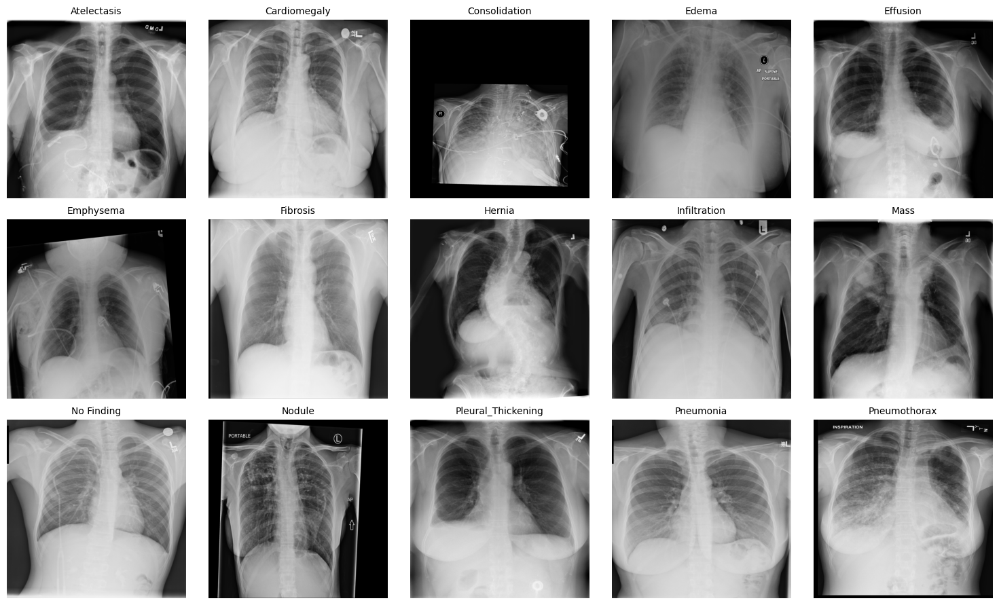

In [17]:
# 1. Get unique labels from the 'Finding Labels' column
unique_labels = df_balanced['Finding Labels'].unique()

# 2. Set up grid dimensions
n_labels = len(unique_labels)
cols = 5 
rows = math.ceil(n_labels / cols)

# 3. Create the grid figure
plt.figure(figsize=(cols * 3, rows * 3))  # Adjust figure size as needed

# 4. For each label, select one representative image and display it
for idx, label in enumerate(unique_labels):
    # Filter the DataFrame to only rows with the current label
    sample_df = df_balanced[df_balanced['Finding Labels'] == label]
    
    # If available, select the first image (or use .sample(1) for a random one)
    if not sample_df.empty:
        sample_row = sample_df.iloc[0]
        img_path = sample_row['full_path']
        try:
            img = cv2.imread(img_path)
        except Exception as e:
            print(f"Error opening image {img_path}: {e}")
            continue
        
        # Create subplot for this label
        plt.subplot(rows, cols, idx + 1)
        plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        plt.title(label, fontsize=10)
        plt.axis('off')
    else:
        print(f"No image found for label: {label}")

plt.tight_layout()
plt.show()

In [18]:
unique_labels_list = list(unique_labels)

In [19]:
def read_image(image_size, file_path):
    img = cv2.imread(file_path)
    if img is not None:
        if len(img.shape) == 2:  # Already grayscale
            img = cv2.applyColorMap(img, cv2.COLORMAP_BONE)
        else:
            img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)  # Convert to grayscale first
            img = cv2.applyColorMap(img, cv2.COLORMAP_BONE)
        img = cv2.bilateralFilter(img, 2, 50, 50)
        img = cv2.resize(img, (image_size, image_size), interpolation=cv2.INTER_AREA)
    return img

In [20]:
def load_data(df, image_size):
    images = []
    labels = []
    for _, row in df.iterrows():
        img = read_image(image_size, row['full_path'])
        if img is not None:
            images.append(img)
            labels.append(row['Finding Labels'])
    # Convert to one-hot encoding
    labels_df = pd.DataFrame({'Finding Labels': labels})
    one_hot = pd.get_dummies(labels_df['Finding Labels'])
    return np.array(images), one_hot.values

## Balance Dataset

In [21]:
# Stratified split
train_df, val_df = train_test_split(df_balanced,test_size=0.2,stratify=df_balanced['Finding Labels'],random_state=1234)

# Load training data
X_train_balance, y_train_balance = load_data(train_df, image_size)

# Load validation data
X_val_balance, y_val_balance = load_data(val_df, image_size)

print(f"Training: {len(X_train_balance)} images, {y_train_balance.shape} labels")
print(f"Validation: {len(X_val_balance)} images, {y_val_balance.shape} labels")

Training: 2724 images, (2724, 15) labels
Validation: 681 images, (681, 15) labels


## Large Dataset InBalanced

In [22]:
# Define the maximum number of entries per label (median value)
max_entries = 3385

# Group by 'Finding Labels' and sample up to max_entries for each group
df_sampled = (
    df_exploded.groupby("Finding Labels", group_keys=False)
    .apply(lambda x: x.sample(min(len(x), max_entries), random_state=1234))
    .reset_index(drop=True)  # Reset index to get a clean DataFrame
)

# Ensure "Finding Labels" is still present in the DataFrame
print(f"Large Balanced dataset size: {len(df_sampled)}")
print("Columns in the resulting DataFrame:", df_sampled.columns.tolist())

Large Balanced dataset size: 41404
Columns in the resulting DataFrame: ['Image Index', 'Finding Labels', 'Follow-up #', 'Patient ID', 'Patient Age', 'Patient Gender', 'View Position', 'OriginalImage[Width', 'Height]', 'OriginalImagePixelSpacing[x', 'y]', 'Unnamed: 11', 'full_path']


In [23]:
# Start timing the entire block
start_time = time.time()
print("start time "+ str(start_time))
# Stratified split
train_df, val_df = train_test_split(df_sampled, test_size=0.2, stratify=df_sampled['Finding Labels'], random_state=1234)

# Load training data
X_train_inbalance, y_train_inbalance = load_data(train_df, image_size)

# Load validation data
X_val_inbalance, y_val_inbalance = load_data(val_df, image_size)

# End timing the entire block
end_time = time.time()

# Calculate total duration
total_duration = end_time - start_time

# Print results
print("Inbalance data set")
print(f"Training: {len(X_train_inbalance)} images, {y_train_inbalance.shape} labels")
print(f"Validation: {len(X_val_inbalance)} images, {y_val_inbalance.shape} labels")
print(f"Total runtime: {total_duration:.2f} seconds")

start time 1740728671.2995477


libpng warning: iCCP: profile 'ICC Profile': 'GRAY': Gray color space not permitted on RGB PNG
libpng warning: iCCP: profile 'ICC Profile': 'GRAY': Gray color space not permitted on RGB PNG


Inbalance data set
Training: 33123 images, (33123, 15) labels
Validation: 8281 images, (8281, 15) labels
Total runtime: 1445.89 seconds


In [24]:
# this data set too large so i have to reduce it. 
# # Stratified split
# train_df, val_df = train_test_split(df_exploded,test_size=0.2,stratify=df_exploded['Finding Labels'],random_state=1234)

# # Load training data
# X_train_inbalance, y_train_inbalance = load_data(train_df, image_size)

# # Load validation data
# X_val_inbalance, y_val_inbalance = load_data(val_df, image_size)

# print("Inbalance data set")
# print(f"Training: {len(X_train_inbalance)} images, {y_train_inbalance.shape} labels")
# print(f"Validation: {len(X_val_inbalance)} images, {y_val_inbalance.shape} labels")

<a id="8"></a>
# 8. Model Training / Data preparation for validation and training 

### Model Data Taken

In [25]:
# model summary 
def model_summary_print(model):
    model.summary()
    
# model layers
def model_layers(model):
    for idx in range(len(model.layers)):
        print(f'Name : {model.get_layer(index=idx).name}, \t \t | Shape :  {model.get_layer(index=idx).input_spec}')
        
# get last layer convalution of the model
def get_last_convalutional_layer(model):
    # Iterate through the layers to find the last convolutional layer
    last_conv_layer_name = None
    for layer in reversed(model.layers):
        if isinstance(layer, tf.keras.layers.Conv2D):
            last_conv_layer_name = layer.name
            break
    print("Name of the last convolutional layer:", last_conv_layer_name)
    return last_conv_layer_name

# plot model architecture 
def plot_model_png(model, model_name):
    name = f'plot-{model_name}.png'
    plot_model(model, show_shapes=True, show_layer_names=True, to_file=name)
    
# -----========----------------
# model inside info
def count_params(weights):
    total_params = 0
    for w in weights:
        if isinstance(w, tf.keras.layers.Layer):
            total_params += tf.size(w.trainable_weights).numpy()
        else:
            total_params += tf.size(w).numpy()
    return total_params

def model_inside_info(model,model_name):
#     Get the total number of parameters
    total_params = count_params(model.weights)

#     Get the number of trainable parameters
    trainable_params = count_params(model.trainable_weights)

#     Get the number of non-trainable parameters (optional)
    non_trainable_params = count_params(model.non_trainable_weights)

#     Get the number of layers (manual approach)
    num_layers = len(model.layers)
    
    headers = ["Total Parameters","Trainable Parameters", "Number of Layers"]
    table = ['{:.0f}'.format(total_params),'{:.0f}'.format(trainable_params),'{:.0f}'.format(num_layers)]
    
#     Print non-trainable parameters if needed
    if non_trainable_params > 0:
        headers.append("Non-Trainable Parameters")
        table.append('{:.0f}'.format(non_trainable_params))
    
    print(f"Details about model {model_name}")
    for i, header in enumerate(headers):
        print(f'{header} : {table[i]}')
        
    # Get input shape
    input_shape = model.input_shape

    # Get output shape
    output_shape = model.output_shape

    print(f'Input shape: {input_shape}')
    print(f'Output shape: {output_shape}')
    
        # Get weights as numpy arrays
    weights = model.get_weights()

    for i, weights_layer in enumerate(weights):
        print(f'Layer {i}: {weights_layer.shape}')
        
        # Get model configuration as JSON
    model_config = model.get_config()

    # Print or save the model configuration
#     print(model_config)

# model training or not validation
def model_is_trained_or_not(model):
    # Check if any of the layers have non-random weights
    is_trained = False
    for layer in model.layers:
        if layer.trainable_weights:
            is_trained = True
            break

    if is_trained:
        print("The model is trained.")
    else:
        print("The model is not trained or its layers have random weights.")

### Multi-Class Dice Coefficient 

In [26]:
def dice_coefficient_multiclass(y_true, y_pred, smooth=1e-6):
    # Ensure shapes are compatible
    y_true = tf.cast(y_true, tf.float32)  # Ensure float type
    y_pred = tf.cast(y_pred, tf.float32)  

    # Get number of dimensions
    num_dims = len(y_true.shape)

    # Dynamically choose axes to sum over (ignore batch and class dimensions)
    if num_dims == 2:  # Shape: (batch_size, num_classes)
        axes = [0]  # Sum over batch only
    elif num_dims == 3:  # Shape: (batch_size, height, num_classes)
        axes = [0, 1]  # Sum over batch & spatial dims
    elif num_dims == 4:  # Shape: (batch_size, height, width, num_classes)
        axes = [0, 1, 2]  # Sum over batch & spatial dims
    else:
        raise ValueError(f"Unsupported tensor shape: {y_true.shape}")

    # Compute Dice score for all classes simultaneously
    intersection = tf.reduce_sum(y_true * y_pred, axis=axes)  # Sum over spatial dimensions
    union = tf.reduce_sum(y_true, axis=axes) + tf.reduce_sum(y_pred, axis=axes)  # Sum over spatial dimensions

    dice = (2. * intersection + smooth) / (union + smooth)  # Compute Dice score for each class
    return tf.reduce_mean(dice)  # Compute mean Dice across all classes


### WanDB Management 

In [27]:
secret_value_1 = user_secrets.get_secret("wandb_api_key")
# wandb_run wandb
import wandb

In [28]:
def combined_loss(y_true, y_pred):
    return tf.keras.losses.categorical_crossentropy(y_true, y_pred) + (1 - dice_coefficient_multiclass(y_true, y_pred))

In [29]:
# Define top-k categorical accuracy function
def top_k_categorical_accuracy(Y_test_label, y_pred, k=5):
    return tf.keras.metrics.top_k_categorical_accuracy(Y_test_label, y_pred, k=k)

In [30]:
METRICS = [
    'accuracy',
    'precision', 
    'recall',
    dice_coefficient_multiclass
#     'categorical_crossentropy',
#     tf.keras.metrics.LogCoshError(),
#     tf.keras.metrics.Poisson(),
#     'cosine_similarity',
#     'mean_squared_error',
#     'mean_absolute_error',
#     top_k_categorical_accuracy,
#     'mean_absolute_percentage_error',
#     tf.keras.metrics.RootMeanSquaredError()
]

def model_training_validation(model,created_model_name,X_train,Y_train_label,x_test,y_test_label):

    print('taining model inside details ', created_model_name,'\n')
#     model_inside_info(model,created_model_name)
#     model_layers(model)
#     model_summary_print(created_model_name)
    
    print('taining model status', created_model_name,'\n')
    
    print('---------- model compile ------------')
    model.compile(loss=combined_loss,
                  optimizer=tf.keras.optimizers.Adam(learning_rate=learning_rate),
                  metrics=METRICS)
    
    print('---------- model checkpoint callback ------------')
    filepath = 'propose.{epoch:03d}.keras'
    checkpoint = ModelCheckpoint(filepath=filepath, monitor='val_accuracy', verbose=1, save_best_only=True, mode='max')
    
    # Define the EarlyStopping callback
    # Define the ReduceLROnPlateau callback with validation accuracy as the monitoring metric
    early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
    reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=5, min_lr=1e-6)

    
    print('---------- tensorboard callback ------------')
    log_dir = f"logs/{created_model_name}-i-s_{image_size}-e-c_{epochs_count}"  + getNowDateTime()
    tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir, histogram_freq=1)


    print('---------- wandb callback start after loggin ------------')
    wandb.login(key=secret_value_1) 
#     wandb.tensorboard.patch(root_logdir="./logs/")
    name_wandb = f'{created_model_name}-img-size_{image_size}-{epochs_count}_epochs-{getNowDateTime()}-learning_rate-{learning_rate}-model'
    
   
    wandb_run = wandb.init(entity = 'lalithk90', 
                     project=wandb_project_name, 
                     sync_tensorboard=True, 
                     name=name_wandb)
    print('---------- model start to fit ------------')
    history=model.fit(X_train, 
                      Y_train_label, 
                      epochs=epochs_count, 
                      batch_size=batch_size, 
                      validation_data= (x_test, y_test_label), 
                      callbacks=[checkpoint,tensorboard_callback,early_stopping,reduce_lr]
                     )

    name = 'save-'+name_wandb+'.h5'
    model.save(name)
    
    print(f'---------- model saved name:- {name}------------')
    
    artifact = wandb.Artifact(name=name, type="dataset")

    # Add a file to the artifact's contents
    artifact.add_file(local_path="/kaggle/working/"+name)

    # Save the artifact version to W&B and mark it
    # as the output of this wandb_wandb_run
    wandb_run.log_artifact(artifact)
    
    wandb.finish()
    
    print('---------- call model training history visualization ------------')
    model_history_visualization(history)
    
    print('---------- call model validation ------------')
    model_evaluation(model,x_test,y_test_label,name_wandb)
    
    print('---------- call model prediction ------------')
    prediction(model, name_wandb)

    clean_keras_wandb()


<a id="9"></a>
# 9. Model history visulization

In [31]:
def draw_plot(accuracy,validation_accuracy,validation_label,validation_accuracy_label, plot_title ):
    epochs = range(len(accuracy))
    fig = plt.figure(figsize=(8,4))
    plt.title(plot_title)
    plt.xticks(np.arange(0, len(accuracy), 10))
    plt.plot(epochs,accuracy,'r', label=validation_label, marker="o")
    plt.plot(epochs,validation_accuracy,'b', label=validation_accuracy_label, marker="*")
    plt.legend(loc='upper left')
#     plt.savefig('Multiclass Model .png')
    plt.figure()
    plt.show()
    
def model_history_visualization(history):
    accuracy = history.history['accuracy']
    epochs = range(0,len(accuracy))
    
    draw_plot(accuracy, history.history['val_accuracy'], 'accuracy','val_accuracy','Training and Validation Accuracy')
    draw_plot(history.history['loss'], history.history['val_loss'], 'loss','val_loss', 'Training and Validation Loss')
    draw_plot(history.history['precision'], history.history['val_precision'], 'precision','val_precision', 'Training and Validation Precision')
    draw_plot(history.history['recall'],  history.history['val_recall'], 'recall','val_recall','Training and Validation Recall')
    draw_plot(history.history['dice_coefficient_multiclass'],  history.history['val_dice_coefficient_multiclass'], 'dice_coefficient_multiclass','val_dice_coefficient_multiclass','Training and Validation Dice Coefficient Multiclass')
#     draw_plot(history.history['mean_squared_error'], history.history['val_mean_squared_error'], 'mean_squared_error','val_mean_squared_error', 'Training and Validation Mean_squared_error')
#     draw_plot(history.history['mean_absolute_error'], history.history['val_mean_absolute_error'], 'mean_absolute_error','val_mean_absolute_error', 'Training and Validation Mean_absolute_error')
#     draw_plot(history.history['mean_absolute_percentage_error'], history.history['val_mean_absolute_percentage_error'], 'mean_absolute_percentage_error','val_mean_absolute_percentage_error', 'Training and Validation Mean_absolute_percentage_error')
#     draw_plot(history.history['cosine_similarity'], history.history['val_cosine_similarity'], 'cosine_similarity','val_cosine_similarity', 'Training and Validation Cosine_similarity')
#     draw_plot(history.history['categorical_crossentropy'], history.history['val_categorical_crossentropy'], 'categorical_crossentropy','val_categorical_crossentropy','Training and Validation Categorical_crossentropy')
#     draw_plot(history.history['top_k_categorical_accuracy'], history.history['val_top_k_categorical_accuracy'], 'top_k_categorical_accuracy','val_top_k_categorical_accuracy', 'Training and Validation Top_k_categorical_accuracy')
#     draw_plot(history.history['logcosh'], history.history['val_logcosh'], 'log_cosh_error','val_log_cosh_error', 'Training and Validation Log_cosh_error')
#     draw_plot(history.history['poisson'], history.history['val_poisson'], 'poisson','val_poisson', 'Training and Validation Poisson')
#     draw_plot(history.history['root_mean_squared_error'], history.history['val_root_mean_squared_error'], 'root_mean_squared_error','val_root_mean_squared_error', 'Training and Validation Root_mean_squared_error')
    print('---------- end model training history visualization ------------')

<a id="10"></a>
# 10. Model Evaluation

In [32]:
def model_evaluate(model, X_test,Y_test_label,model_name):
#     ------------------------- start ----------------
    score = model.evaluate(X_test,Y_test_label)
    print(f'{model_name}')
    
    headers = ["Test loss","Test accuracy","Test loss(%)","Test accuracy(%)"]
    table = [[score[0],score[1],(score[0]*100),(score[1]*100)]]
    print(tabulate(table, headers, tablefmt="double_outline"))
   #     ------------------------- end ---------------- 
   
def visualize_confusion_matrix(cm,model_name):
    #     ------------------------- start ----------------
    # Visualize confusion matrix (optional)
    plt.figure(figsize=(10, 8))
    sns.heatmap(cm, annot=True, cmap="Blues", fmt="d", xticklabels=pathology_list, yticklabels=pathology_list)
    plt.xlabel("Predicted")
    plt.ylabel("True")
    plt.title(f"Confusion Matrix - {model_name}")
    plt.savefig(f"{model_name}_confusion_matrix.png")  # Save the plot as an image
    plt.show()
    #     ------------------------- end ----------------
    
def model_sensitivity(Y_test_label, cm, y_pred, model_name ):
#     ------------------------- start ----------------
    # Sensitivity = True Positives/ (True Positives + True Negatives)
    # Calculate sensitivity for each class
    classes = np.unique(Y_test_label)
    sensitivities = {}
    for c in classes:
        tp = cm[c, c]
        fn = np.sum(cm[c, :]) - tp
        sensitivities[c] = tp / (tp + fn)

    # Find the modal sensitivity
    modal_sensitivity = max(sensitivities, key=sensitivities.get)

    # Assuming `Y_test_label` are your true labels and `y_pred` are your predicted labels
    res = []
    for l in np.unique(Y_test_label):
        prec, recall, _, _ = precision_recall_fscore_support(Y_test_label == l, y_pred == l, pos_label=True, average=None)
        res.append([l, recall[0]])

    # Convert to DataFrame for easier manipulation
    df = pd.DataFrame(res, columns=['class', 'sensitivity'])

    # Calculate the average sensitivity
    average_sensitivity = df['sensitivity'].mean()

    print(f"{model_name} Sensitivities")
    
    headers = ["Label","Sensitivities"]
    table = []
    for i in range(len(sensitivities)):
        table.append([pathology_list[i],sensitivities[i]])
    print(tabulate(table, headers, tablefmt="double_outline"))
    
    headers = ["Modal Sensitivity","Modal Average Sensitivity"]
    table = [[modal_sensitivity,average_sensitivity]]
    print(tabulate(table, headers, tablefmt="double_outline"))
    
    #     ------------------------- end ----------------
    
def model_specificity(cm,model_name):
#     ------------------------- start ----------------
    # Specificity = True Negatives/ (False Positives + True Negatives)

    # Calculate specificity for each class
    FP = cm.sum(axis=0) - np.diag(cm) # False positives
    FN = cm.sum(axis=1) - np.diag(cm) # False negatives
    TN = cm.sum() - (FP + FN + np.diag(cm)) # True negatives

    Specificity = TN / (TN + FP)
        
    headers = ["Label", "Specificity"]
    table = []
    # Print specificity for each class
    for i, spec in enumerate(Specificity):
        table.append([pathology_list[i],spec])
        
    print(f"Specificity {model_name}")
    print(tabulate(table, headers, tablefmt="double_outline"))    
    #     ------------------------- end ----------------
    
def model_roc_auc(Y_test_label,predictions,model_name):
#     ------------------------- start ----------------

    # Calculate ROC AUC score for each class against all other classes
    roc_auc = roc_auc_score(Y_test_label, predictions, multi_class='ovr')
    # Calculate ROC AUC score for each pair of classes
    roc_auc = roc_auc_score(Y_test_label, predictions, multi_class='ovo')

    print(f"ROC AUC Score {model_name} ")
    headers = ["ROC AUC Score (OvR) -> One-vs-Rest","ROC AUC Score (OvO) -> One-vs-One"]
    table = [[roc_auc,roc_auc]]
    print(tabulate(table, headers, tablefmt="double_outline"))   
    
    print("\n The area under the ROC curve (AUC) results were considered")
           
    headers = ["Model Status","Result Range"]
    table = [["excellent","AUC values between 0.9 - 1 "],["good"," AUC values between 0.8-0.9 "],["fair" , "AUC values between 0.7-0.8 "],["poor" , "AUC values between 0.6-0.7 "],["failed" , "AUC values between 0.5-0.6"]]
    print(tabulate(table, headers, tablefmt="double_outline"))
    
    #     ------------------------- end ----------------

def model_accuracy_score(Y_test_label, y_pred, model_name):
#     ------------------------- start ----------------
    ac_s_without_normalize = accuracy_score(Y_test_label, y_pred)
    ac_s_with_normalize = accuracy_score(Y_test_label, y_pred, normalize=False)
    print(f'Model Accuracy Score {model_name}')
    headers = ["Accuracy score without normalize","Accuracy score with normalize"]
    table = [[ac_s_without_normalize,ac_s_with_normalize]]
    print(tabulate(table, headers, tablefmt="double_outline")) 
    
    #     ------------------------- end ----------------
    
def model_balanced_accuracy(Y_test_label, y_pred, model_name):
#     ------------------------- start ----------------
    balanced_accuracy_s = balanced_accuracy_score(Y_test_label, y_pred)
    
    print(f'Model Balanced Score {model_name}')
    headers = ["Balanced accuracy score"]
    table = [[balanced_accuracy_s]]
    print(tabulate(table, headers, tablefmt="double_outline")) 
    
    #     ------------------------- end ----------------
    
def model_categorical_accuracy(Y_test_label, y_pred, model_name):   
    #------------------------- start ----------------
    m = tf.keras.metrics.categorical_accuracy(Y_test_label, y_pred)
    print(m)
    print(f'Categorical accuracy: {m:.4f}')
    print(f'Categorical accuracy {model_name}')
#     headers = ["Categorical accuracy"]
#     table = [[m]]
#     print(table)
#     print(tabulate(table, headers, tablefmt="double_outline")) 
    #------------------------- end ----------------
   

def model_classification_report(Y_test_label, y_pred, model_name):
        print(f"Classification Report : {model_name}")
        classification_report_values = classification_report(Y_test_label, y_pred, output_dict=True,target_names = pathology_list)

def model_precision_score(Y_test_label, y_pred, model_name):
    print(f"{model_name} Precision score \n ===================================================\n")
#     ------------------------- start ----------------
    precision_score_1 = precision_score(Y_test_label, y_pred, average=None)
    
    headers = ["Label", "Precision score"]
    table = []
    # Print specificity for each class
    for i, score in enumerate(precision_score_1):
        table.append([pathology_list[i],score])

    print(tabulate(table, headers, tablefmt="double_outline"))

    precision_score_macro = precision_score(Y_test_label, y_pred, average='macro')
    precision_score_micro = precision_score(Y_test_label, y_pred, average='micro')
    precision_score_weighted = precision_score(Y_test_label, y_pred, average='weighted')
    
    headers = ["Precision score macro","Precision score micro","Precision score weighted"]
    table = [[precision_score_macro,precision_score_micro,precision_score_weighted]]
    print(tabulate(table, headers, tablefmt="double_outline")) 


    data = {'Micro': precision_score_macro, 'Macro': precision_score_micro, 'Weighted': precision_score_weighted}
    values = list(data.keys())
    results = list(data.values())

    fig = plt.figure(figsize=(10, 5))
    # creating the bar plot
    plt.bar(values, results, color='maroon', width=0.4)
    plt.xlabel('Value', fontweight='bold', fontsize=15)
    plt.ylabel('Various scores', fontweight='bold', fontsize=15)
    plt.title(f"{model_name} Various precision scores according to average")
    plt.savefig(f"{model_name}_Precision_score.png")  # Save the plot as an image
    plt.show()
        #     ------------------------- end ----------------
        
def model_recall_score(Y_test_label, y_pred, model_name):
    print(f"{model_name} Recall score \n ===================================================\n")
    #     ------------------------- start ----------------
    recall_score_1 = recall_score(Y_test_label, y_pred, average=None)
    
    headers = ["Label", "Recall score"]
    table = []
    # Print specificity for each class
    for i, score in enumerate(recall_score_1):
        table.append([pathology_list[i],score])

    print(tabulate(table, headers, tablefmt="double_outline"))
    
    recall_score_macro = recall_score(Y_test_label, y_pred, average='macro')
    recall_score_micro = recall_score(Y_test_label, y_pred, average='micro')
    recall_score_weighted = recall_score(Y_test_label, y_pred, average='weighted')

    headers = ["Recall score macro","Recall score micro","Recall score weighted"]
    table = [[recall_score_macro,recall_score_micro,recall_score_weighted]]
    print(tabulate(table, headers, tablefmt="double_outline")) 

    data = {'Micro': recall_score_macro, 'Macro': recall_score_micro, 'Weighted': recall_score_weighted}
    values = list(data.keys())
    results = list(data.values())

    fig = plt.figure(figsize=(10, 5))
    # creating the bar plot
    plt.bar(values, results, color='blue', width=0.4)

    plt.xlabel('Value', fontweight='bold', fontsize=15)
    plt.ylabel('Various scores', fontweight='bold', fontsize=15)
    plt.title(f"{model_name} Various recall scores according to average")
    plt.savefig(f"{model_name}_recall_score.png")  # Save the plot as an image
    plt.show()
    
#     ------------------------- end ----------------
        
def model_f1_score(Y_test_label, y_pred, model_name):
    print(f"{model_name} F1 score \n ===================================================\n")
    #     ------------------------- start ----------------
    f1_score_1 = f1_score(Y_test_label, y_pred, average=None)
    
    headers = ["Label", "F1 score"]
    table = []
    # Print specificity for each class
    for i, score in enumerate(f1_score_1):
        table.append([pathology_list[i],score])

    print(tabulate(table, headers, tablefmt="double_outline"))
    
    f1_score_macro = f1_score(Y_test_label, y_pred, average='macro')
    f1_score_micro = f1_score(Y_test_label, y_pred, average='micro')
    f1_score_weighted = f1_score(Y_test_label, y_pred, average='weighted')

    headers = ["F1 score macro","F1 score micro","F1 score weighted"]
    table = [[f1_score_macro,f1_score_micro,f1_score_weighted]]
    print(tabulate(table, headers, tablefmt="double_outline")) 

    data = {'Micro': f1_score_macro, 'Macro': f1_score_micro,'Weighted': f1_score_weighted}
    values = list(data.keys())
    results = list(data.values())

    fig = plt.figure(figsize=(10, 5))
    # creating the bar plot
    plt.bar(values, results, color='green',width=0.4)
    
    plt.xlabel('Value', fontweight='bold', fontsize=15)
    plt.ylabel('Various scores', fontweight='bold', fontsize=15)
    plt.title(f"{model_name} Various F1 scores according to average")
    plt.savefig(f"{model_name}_f1_score.png")  # Save the plot as an image
    plt.show()

        #     ------------------------- end ----------------
def model_evaluation(model, X_test,Y_test_label,model_name):
    
    print('-----------start to call some validation ------------')
    model_evaluate(model, X_test,Y_test_label,model_name)
    
         # Predict the classes
    predictions = model.predict(X_test)

    y_pred = np.argmax(predictions, axis=1)
    Y_test_label= np.argmax(Y_test_label, axis=1)

    cm = confusion_matrix(Y_test_label, y_pred)
    
    visualize_confusion_matrix(cm, model_name)
    model_sensitivity(Y_test_label, cm, y_pred, model_name)
    model_specificity(cm, model_name)
    model_roc_auc(Y_test_label, predictions, model_name)
    model_accuracy_score(Y_test_label, y_pred, model_name)
    model_balanced_accuracy(Y_test_label, y_pred, model_name)
    model_categorical_accuracy(Y_test_label, y_pred, model_name)
    model_precision_score(Y_test_label, y_pred, model_name)
    model_recall_score(Y_test_label, y_pred, model_name)
    model_f1_score(Y_test_label, y_pred, model_name)
    model_classification_report(Y_test_label, y_pred, model_name)
    print(f'--- Trainned model data - {model_name} ---')
    model_is_trained_or_not(model)
    model_layers(model)
    model_inside_info(model, model_name)
    model_summary_print(model)
    plot_model_png(model, model_name)
    
    headers = ["Image size","Learning rate","Wandb project name","Batch size","Epochs count","Num classes"]
    table = [[image_size,learning_rate,wandb_project_name,batch_size,epochs_count,num_classes]]
    print(tabulate(table, headers, tablefmt="double_outline")) 

In [33]:
def create_image_to_test(img_path):
    #         read image to predict
    img = cv2.imread(img_path)
    # img = cv2.bilateralFilter(img, 2, 50, 50) # remove images noise.
    # img = cv2.applyColorMap(img, cv2.COLORMAP_BONE) # produce a pseudocolored image.
    img_read = cv2.resize(img,(image_size,image_size))
    img_array = np.array(img_read)
    img_array = img_array.reshape(1,image_size,image_size,3)
    return img_array
    
def prediction(model, model_name):
    print('prediction related to ', model_name)
    
    image_paths = []
    # Loop over each pathology
    for pathology in pathology_list:
        # Filter rows with the current pathology label
        df_label = df_balanced[df_balanced['Finding Labels'] == pathology]
        
        # If there is at least one entry, sample one random image path; otherwise, append None
        if not df_label.empty:
            random_path = df_label.sample(1, random_state=42)['full_path'].iloc[0]
            image_paths.append(random_path)
        else:
            image_paths.append(None)
     
    actual_test_val = pathology_list
    table = []
    # Iterate over the image paths and display each image
    for i, image_path in enumerate(image_paths):
        img_array = create_image_to_test(image_path)     
        pred_ = model.predict(img_array)
        preds = np.squeeze(pred_)
        predict_label = pathology_list[pred_.argmax()]
        actual_label = actual_test_val[i]
        
        table.append([actual_label,predict_label])
        
        title = f'Prediction label : {predict_label} Actual Labeled : {actual_label}\n _________________________________________\n Result related all classes '
        for k in range(len(pathology_list)):
            title = title + f'\n {pathology_list[k]} -----> {preds[k]} '
        img_l = image.load_img(image_path)
        plt.imshow(img_l,interpolation='nearest')
        plt.title(title)
        plt.show() 
        
    headers = ["Actual Test Label","Predict Label"]
    print(tabulate(table, headers, tablefmt="double_outline"))       

<a id="11"></a>
## 11. *Sample model* Creation Training And Validation with *Balance* and *Inbalance* Data set

taining model inside details  balance_propose 

taining model status balance_propose 

---------- model compile ------------
---------- model checkpoint callback ------------
---------- tensorboard callback ------------
---------- wandb callback start after loggin ------------


wandb: W&B API key is configured. Use `wandb login --relogin` to force relogin
wandb: WARNING If you're specifying your api key in code, ensure this code is not shared publicly.
wandb: WARNING Consider setting the WANDB_API_KEY environment variable, or running `wandb login` from the command line.
wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc
wandb: Currently logged in as: lalithk90. Use `wandb login --relogin` to force relogin
wandb: wandb version 0.19.7 is available!  To upgrade, please run:
wandb:  $ pip install wandb --upgrade
wandb: Tracking run with wandb version 0.17.0
wandb: Run data is saved locally in /kaggle/working/wandb/run-20250228_080853-g9qlusur
wandb: Run `wandb offline` to turn off syncing.
wandb: Syncing run balance_propose-img-size_224-100_epochs-2025-02-28-08-08-41-learning_rate-0.001-model
wandb: ⭐️ View project at https://wandb.ai/lalithk90/detection_of_thoracic_diseases_using_chest_x-ray
wandb: 🚀 View run at https://wandb.ai/lalithk90/det

---------- model start to fit ------------
Epoch 1/100


2025-02-28 08:09:21.964565: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 223: 2.30379, expected 1.97036
2025-02-28 08:09:21.964896: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 50176: 4.16142, expected 3.52349
2025-02-28 08:09:21.964918: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 50177: 4.95921, expected 4.32127
2025-02-28 08:09:21.964927: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 50178: 5.2054, expected 4.56746
2025-02-28 08:09:21.964936: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 50180: 4.92011, expected 4.28217
2025-02-28 08:09:21.964945: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 50182: 5.34126, expected 4.70333
2025-02-28 08:09:21.964953: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 50183: 4.30751, expected 3.66957
2025-02-28 08:09:21.964961: E 

 1/86 ━━━━━━━━━━━━━━━━━━━━ 34:15 24s/step - accuracy: 0.0312 - dice_coefficient_multiclass: 0.0540 - loss: 5.3230 - precision: 0.0000e+00 - recall: 0.0000e+00

I0000 00:00:1740730175.407264      96 device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


85/86 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - accuracy: 0.0780 - dice_coefficient_multiclass: 0.0638 - loss: 4.4905 - precision: 0.0812 - recall: 0.0120

2025-02-28 08:09:42.678933: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 12: 3.91724, expected 3.41098
2025-02-28 08:09:42.678996: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 29: 3.98621, expected 3.47995
2025-02-28 08:09:42.679007: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 84: 4.03461, expected 3.52836
2025-02-28 08:09:42.679016: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 181: 3.56278, expected 3.05652
2025-02-28 08:09:42.679025: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 198: 3.61019, expected 3.10393
2025-02-28 08:09:42.679033: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 223: 2.49794, expected 1.99169
2025-02-28 08:09:42.679104: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 10080: 3.65054, expected 3.14428
2025-02-28 08:09:42.679114: E external/loc

86/86 ━━━━━━━━━━━━━━━━━━━━ 0s 174ms/step - accuracy: 0.0781 - dice_coefficient_multiclass: 0.0638 - loss: 4.4876 - precision: 0.0812 - recall: 0.0119

wandb: WARNING When using several event log directories, please call `wandb.tensorboard.patch(root_logdir="...")` before `wandb.init`
2025-02-28 08:09:52.343017: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 12: 2.35725, expected 2.00221
2025-02-28 08:09:52.343374: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 50176: 3.02376, expected 2.21105
2025-02-28 08:09:52.343400: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 50177: 4.0476, expected 3.23488
2025-02-28 08:09:52.343425: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 50178: 3.7927, expected 2.97998
2025-02-28 08:09:52.343434: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 50179: 3.28446, expected 2.47175
2025-02-28 08:09:52.343443: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 50180: 3.79552, expected 2.9828
2025-02-28 08:09:52.343452: E external


Epoch 1: val_accuracy improved from -inf to 0.07342, saving model to propose.001.keras
86/86 ━━━━━━━━━━━━━━━━━━━━ 46s 252ms/step - accuracy: 0.0782 - dice_coefficient_multiclass: 0.0638 - loss: 4.4849 - precision: 0.0812 - recall: 0.0119 - val_accuracy: 0.0734 - val_dice_coefficient_multiclass: 0.0407 - val_loss: 12.2921 - val_precision: 0.0711 - val_recall: 0.0646 - learning_rate: 0.0010
Epoch 2/100
85/86 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - accuracy: 0.1306 - dice_coefficient_multiclass: 0.0855 - loss: 3.7577 - precision: 0.2103 - recall: 0.0156
Epoch 2: val_accuracy improved from 0.07342 to 0.09692, saving model to propose.002.keras
86/86 ━━━━━━━━━━━━━━━━━━━━ 7s 76ms/step - accuracy: 0.1307 - dice_coefficient_multiclass: 0.0855 - loss: 3.7579 - precision: 0.2095 - recall: 0.0155 - val_accuracy: 0.0969 - val_dice_coefficient_multiclass: 0.0604 - val_loss: 6.5001 - val_precision: 0.1237 - val_recall: 0.0514 - learning_rate: 0.0010
Epoch 3/100
85/86 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - 

wandb:                                                                                
wandb: 
wandb: Run history:
wandb:                                                     global_step ▁▂▂▂▃▃▃▃▄▄▄▄▅▅▅▅▆▆▆▆▇▇▇▇▇█
wandb:                                            train/epoch_accuracy ▁▂▂▂▃▄▄▅▇▇▇██
wandb:                         train/epoch_dice_coefficient_multiclass ▁▁▂▂▂▃▄▄▆▇▇▇█
wandb:                                       train/epoch_learning_rate ████████▁▁▁▁▁
wandb:                                                train/epoch_loss █▇▆▆▅▅▄▃▂▂▁▁▁
wandb:                                           train/epoch_precision ▁▂▂▄▅▆▆▇█████
wandb:                                              train/epoch_recall ▁▁▁▁▂▂▃▄▆▇▇▇█
wandb:                                               train/global_step ▁▁▂▂▃▃▃▄▅▅▆▆▇▇██
wandb:                                       validation/epoch_accuracy ▁▄▇▃█▄▄▅▆▆▇▇▆
wandb:                    validation/epoch_dice_coefficient_multiclass ▁▄▆▆▆▅▆▆█████
wandb:             

---------- call model training history visualization ------------


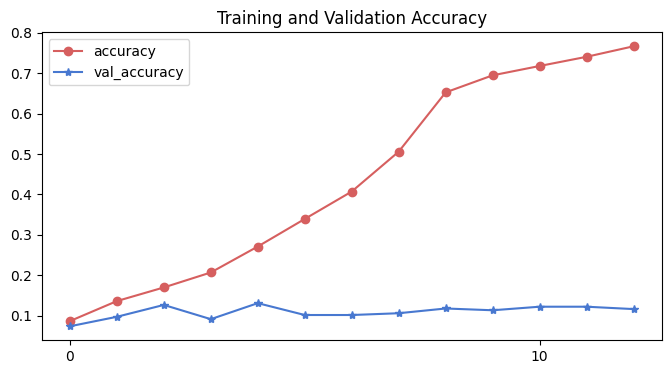

<Figure size 640x480 with 0 Axes>

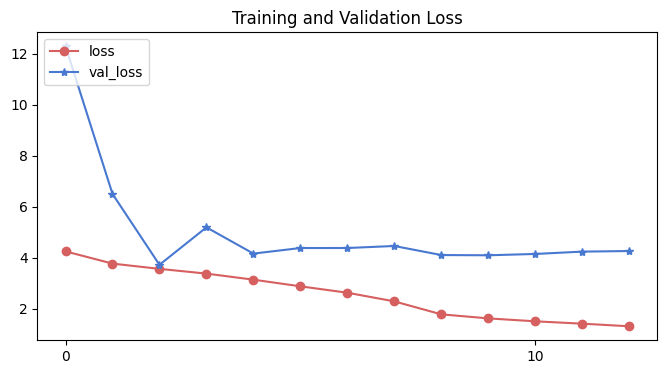

<Figure size 640x480 with 0 Axes>

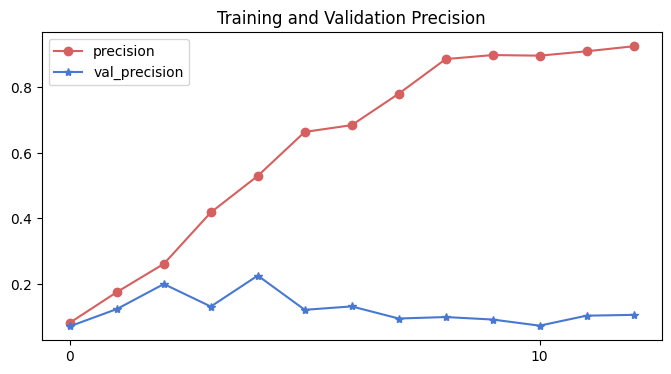

<Figure size 640x480 with 0 Axes>

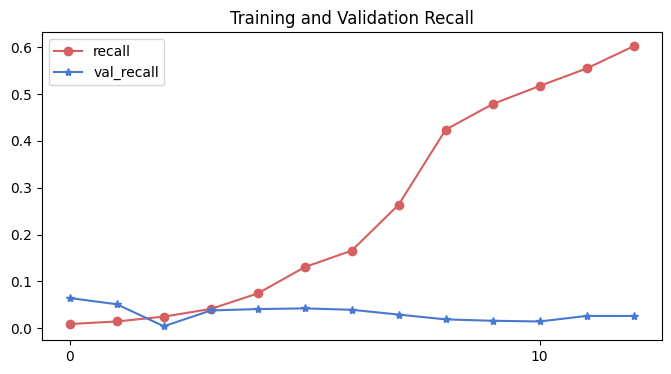

<Figure size 640x480 with 0 Axes>

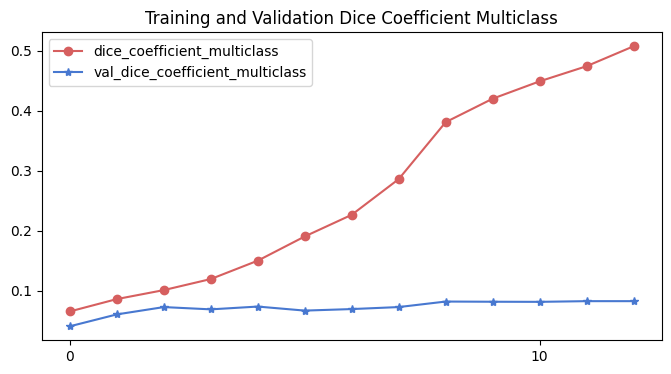

<Figure size 640x480 with 0 Axes>

---------- end model training history visualization ------------
---------- call model validation ------------
-----------start to call some validation ------------
22/22 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.1341 - dice_coefficient_multiclass: 0.0724 - loss: 3.7197 - precision: 0.1515 - recall: 0.0037
balance_propose-img-size_224-100_epochs-2025-02-28-08-08-41-learning_rate-0.001-model
╔═════════════╦═════════════════╦════════════════╦════════════════════╗
║   Test loss ║   Test accuracy ║   Test loss(%) ║   Test accuracy(%) ║
╠═════════════╬═════════════════╬════════════════╬════════════════════╣
║      3.7192 ║        0.126285 ║         371.92 ║            12.6285 ║
╚═════════════╩═════════════════╩════════════════╩════════════════════╝
22/22 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step


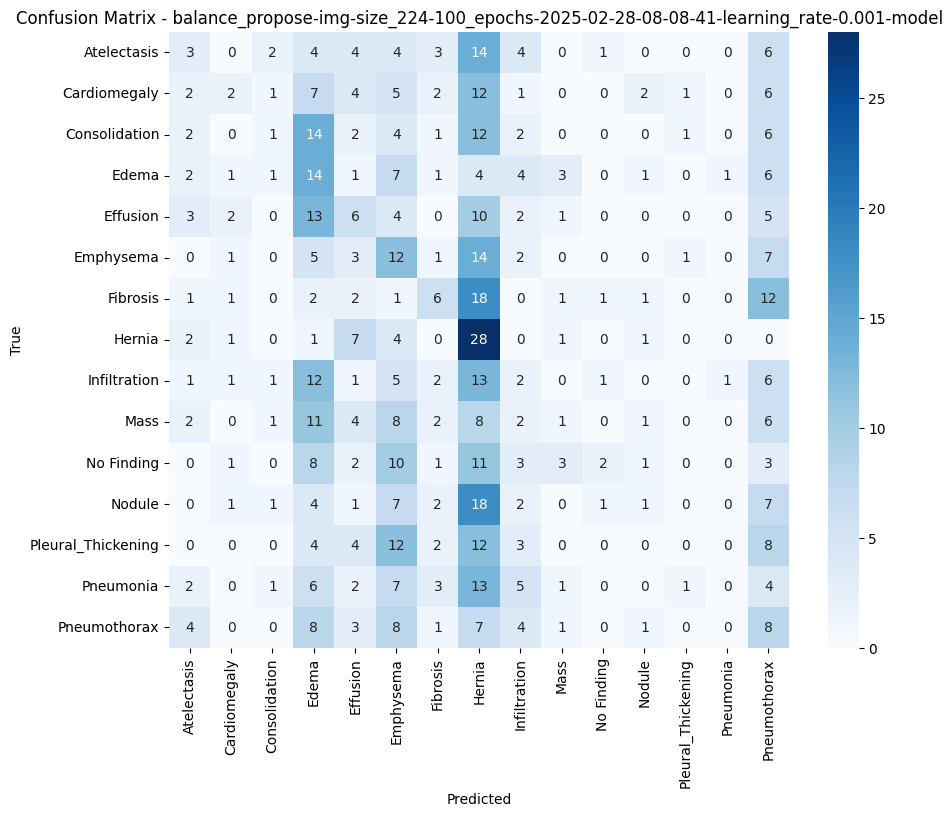

balance_propose-img-size_224-100_epochs-2025-02-28-08-08-41-learning_rate-0.001-model Sensitivities
╔════════════════════╦═════════════════╗
║ Label              ║   Sensitivities ║
╠════════════════════╬═════════════════╣
║ Atelectasis        ║       0.0666667 ║
║ Cardiomegaly       ║       0.0444444 ║
║ Consolidation      ║       0.0222222 ║
║ Edema              ║       0.304348  ║
║ Effusion           ║       0.130435  ║
║ Emphysema          ║       0.26087   ║
║ Fibrosis           ║       0.130435  ║
║ Hernia             ║       0.622222  ║
║ Infiltration       ║       0.0434783 ║
║ Mass               ║       0.0217391 ║
║ No Finding         ║       0.0444444 ║
║ Nodule             ║       0.0222222 ║
║ Pleural_Thickening ║       0         ║
║ Pneumonia          ║       0         ║
║ Pneumothorax       ║       0.177778  ║
╚════════════════════╩═════════════════╝
╔═════════════════════╦═════════════════════════════╗
║   Modal Sensitivity ║   Modal Average Sensitivity ║
╠════════════

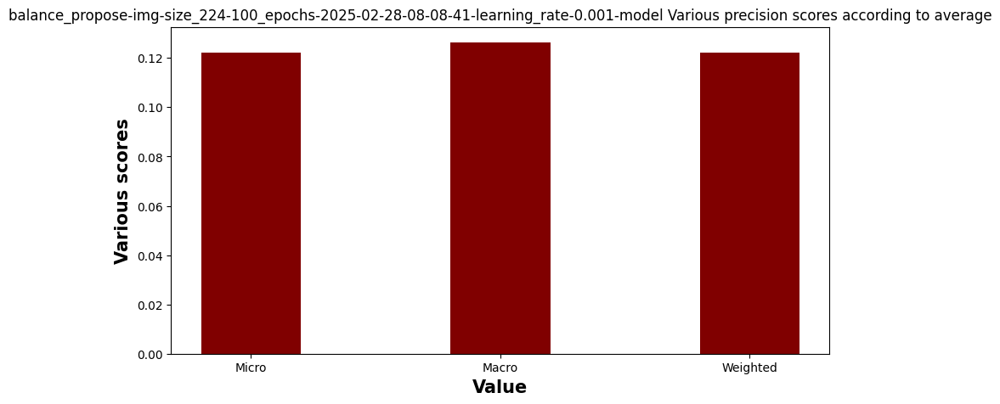

balance_propose-img-size_224-100_epochs-2025-02-28-08-08-41-learning_rate-0.001-model Recall score 

╔════════════════════╦════════════════╗
║ Label              ║   Recall score ║
╠════════════════════╬════════════════╣
║ Atelectasis        ║      0.0666667 ║
║ Cardiomegaly       ║      0.0444444 ║
║ Consolidation      ║      0.0222222 ║
║ Edema              ║      0.304348  ║
║ Effusion           ║      0.130435  ║
║ Emphysema          ║      0.26087   ║
║ Fibrosis           ║      0.130435  ║
║ Hernia             ║      0.622222  ║
║ Infiltration       ║      0.0434783 ║
║ Mass               ║      0.0217391 ║
║ No Finding         ║      0.0444444 ║
║ Nodule             ║      0.0222222 ║
║ Pleural_Thickening ║      0         ║
║ Pneumonia          ║      0         ║
║ Pneumothorax       ║      0.177778  ║
╚════════════════════╩════════════════╝
╔══════════════════════╦══════════════════════╦═════════════════════════╗
║   Recall score macro ║   Recall score micro ║   Recall score we

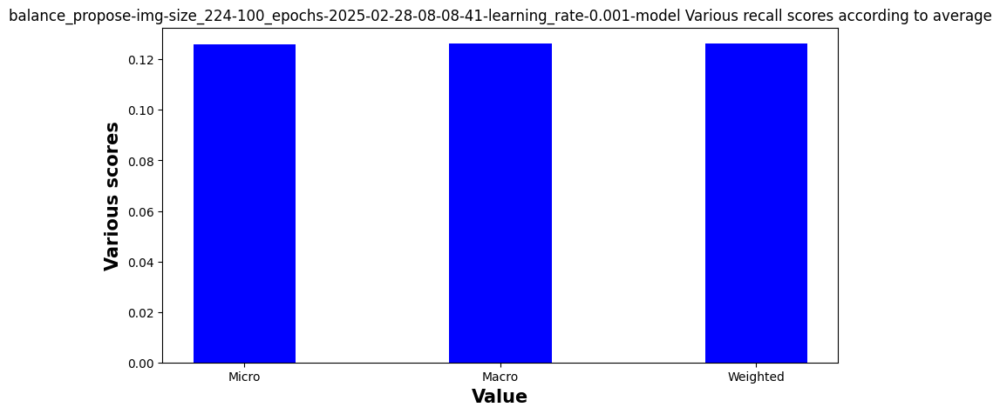

balance_propose-img-size_224-100_epochs-2025-02-28-08-08-41-learning_rate-0.001-model F1 score 

╔════════════════════╦════════════╗
║ Label              ║   F1 score ║
╠════════════════════╬════════════╣
║ Atelectasis        ║  0.0869565 ║
║ Cardiomegaly       ║  0.0714286 ║
║ Consolidation      ║  0.037037  ║
║ Edema              ║  0.176101  ║
║ Effusion           ║  0.130435  ║
║ Emphysema          ║  0.166667  ║
║ Fibrosis           ║  0.164384  ║
║ Hernia             ║  0.23431   ║
║ Infiltration       ║  0.0487805 ║
║ Mass               ║  0.0344828 ║
║ No Finding         ║  0.0784314 ║
║ Nodule             ║  0.037037  ║
║ Pleural_Thickening ║  0         ║
║ Pneumonia          ║  0         ║
║ Pneumothorax       ║  0.118519  ║
╚════════════════════╩════════════╝
╔══════════════════╦══════════════════╦═════════════════════╗
║   F1 score macro ║   F1 score micro ║   F1 score weighted ║
╠══════════════════╬══════════════════╬═════════════════════╣
║        0.0923045 ║         0.12

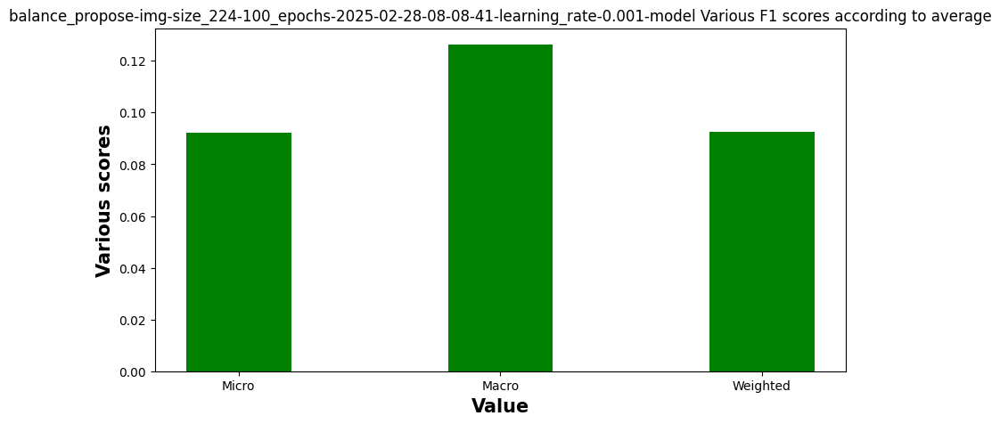

Classification Report : balance_propose-img-size_224-100_epochs-2025-02-28-08-08-41-learning_rate-0.001-model
--- Trainned model data - balance_propose-img-size_224-100_epochs-2025-02-28-08-08-41-learning_rate-0.001-model ---
The model is trained.
Name : input_layer, 	 	 | Shape :  None
Name : conv2d, 	 	 | Shape :  InputSpec(min_ndim=4, axes={-1: 3})
Name : batch_normalization, 	 	 | Shape :  InputSpec(ndim=4, axes={-1: 16})
Name : conv2d_1, 	 	 | Shape :  InputSpec(min_ndim=4, axes={-1: 16})
Name : batch_normalization_1, 	 	 | Shape :  InputSpec(ndim=4, axes={-1: 16})
Name : max_pooling2d, 	 	 | Shape :  InputSpec(ndim=4)
Name : dropout, 	 	 | Shape :  None
Name : conv2d_2, 	 	 | Shape :  InputSpec(min_ndim=4, axes={-1: 16})
Name : batch_normalization_2, 	 	 | Shape :  InputSpec(ndim=4, axes={-1: 32})
Name : conv2d_3, 	 	 | Shape :  InputSpec(min_ndim=4, axes={-1: 32})
Name : batch_normalization_3, 	 	 | Shape :  InputSpec(ndim=4, axes={-1: 32})
Name : max_pooling2d_1, 	 	 | Shape : 

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d (Conv2D)                 │ (None, 224, 224, 16)   │           448 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 224, 224, 16)   │            64 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 224, 224, 16)   │         2,320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 224, 224, 16)   │            64 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 112, 112, 16)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 112, 112, 16)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 112, 112, 32)   │         4,640 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 112, 112, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 112, 112, 32)   │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (None, 112, 112, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 56, 56, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 56, 56, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 56, 56, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_4           │ (None, 56, 56, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (None, 56, 56, 64)     │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_5           │ (None, 56, 56, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 28, 28, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 28, 28, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 50176)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 256)            │    12,845,312 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_6           │ (None, 256)            │         1,02

 Total params: 38,767,583 (147.89 MB)

 Trainable params: 12,922,207 (49.29 MB)

 Non-trainable params: 960 (3.75 KB)

 Optimizer params: 25,844,416 (98.59 MB)

╔══════════════╦═════════════════╦══════════════════════════════════════════════════╦══════════════╦════════════════╦═══════════════╗
║   Image size ║   Learning rate ║ Wandb project name                               ║   Batch size ║   Epochs count ║   Num classes ║
╠══════════════╬═════════════════╬══════════════════════════════════════════════════╬══════════════╬════════════════╬═══════════════╣
║          224 ║           0.001 ║ detection_of_thoracic_diseases_using_chest_x-ray ║           32 ║            100 ║            15 ║
╚══════════════╩═════════════════╩══════════════════════════════════════════════════╩══════════════╩════════════════╩═══════════════╝
---------- call model prediction ------------
prediction related to  balance_propose-img-size_224-100_epochs-2025-02-28-08-08-41-learning_rate-0.001-model


2025-02-28 08:11:33.196656: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 100352: 3.85654, expected 2.92659
2025-02-28 08:11:33.196716: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 100353: 6.2966, expected 5.36665
2025-02-28 08:11:33.196734: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 100354: 5.15789, expected 4.22794
2025-02-28 08:11:33.196750: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 100355: 5.45824, expected 4.52829
2025-02-28 08:11:33.196762: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 100356: 5.63214, expected 4.70219
2025-02-28 08:11:33.196775: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 100357: 5.33488, expected 4.40493
2025-02-28 08:11:33.196788: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 100358: 5.6038, expected 4.67384
2025-02-28 08:11:33.19

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 919ms/step


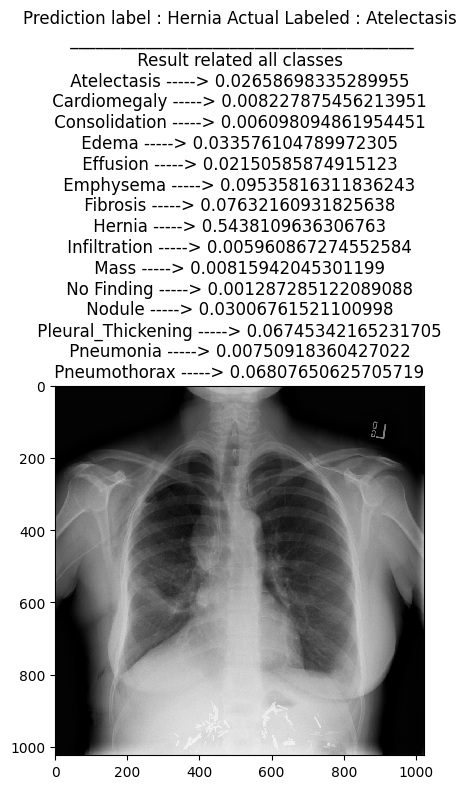

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


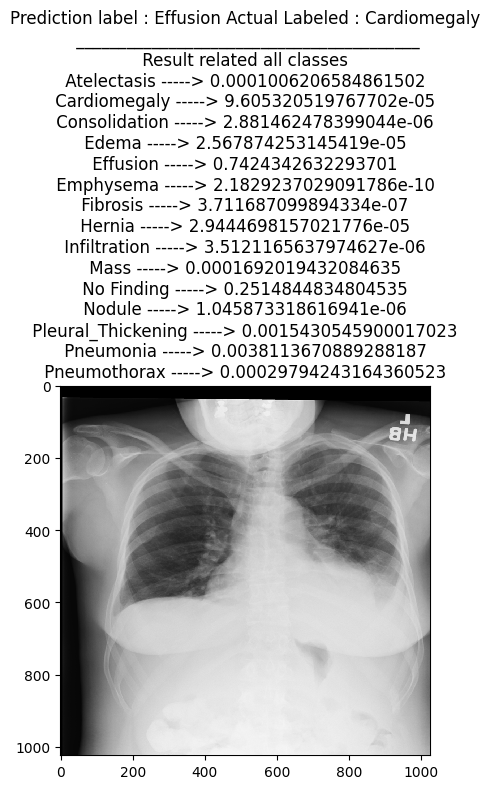

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


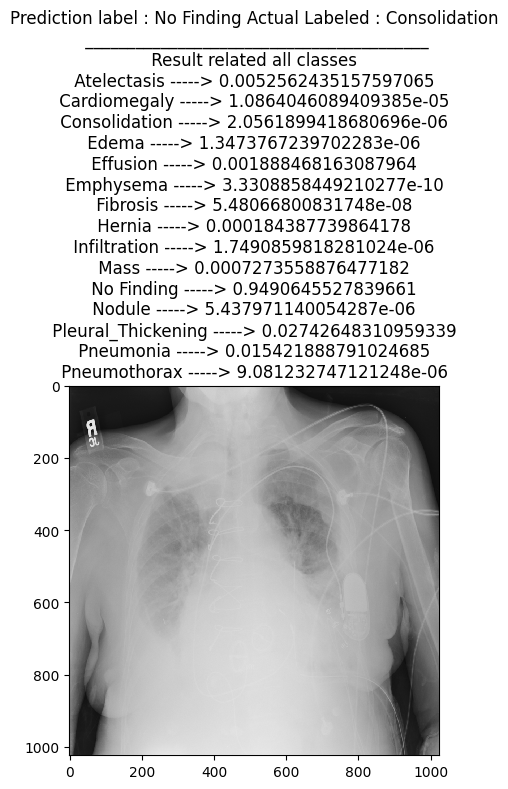

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


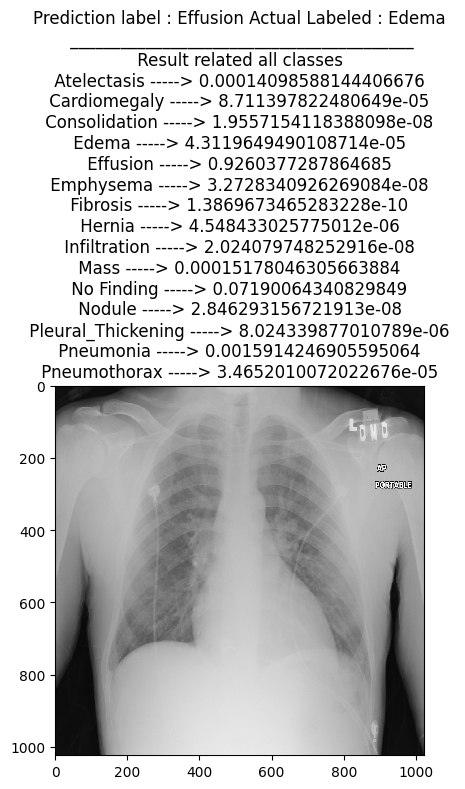

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


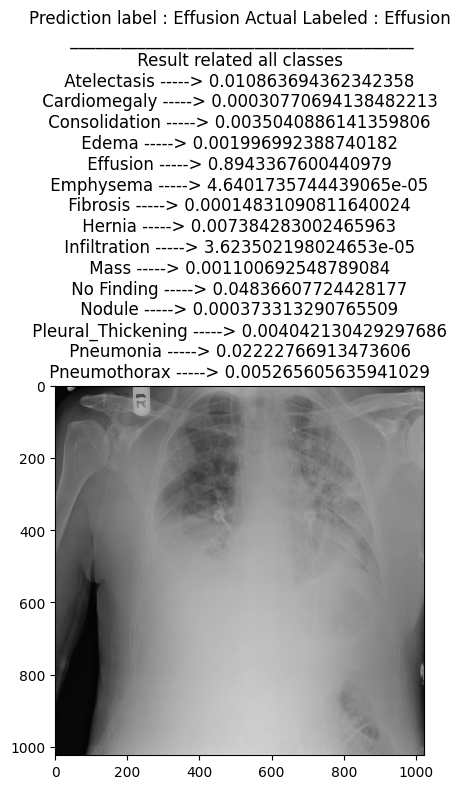

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


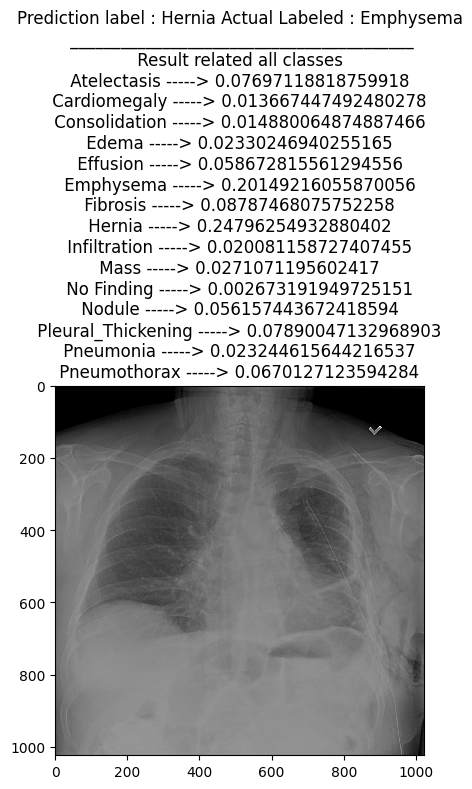

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


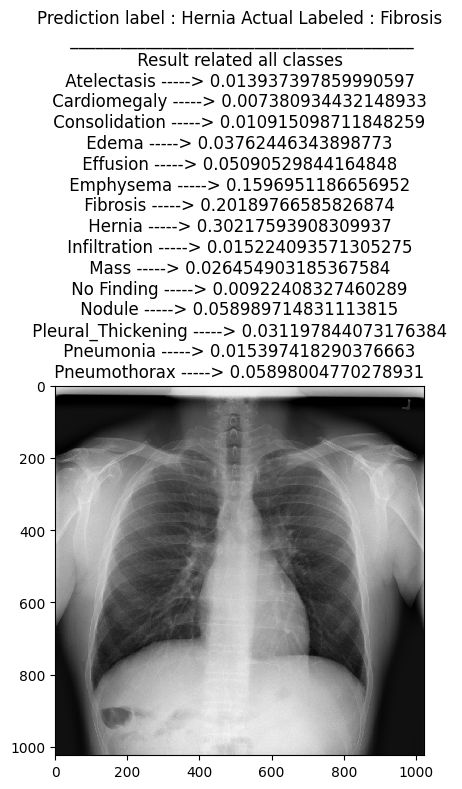

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


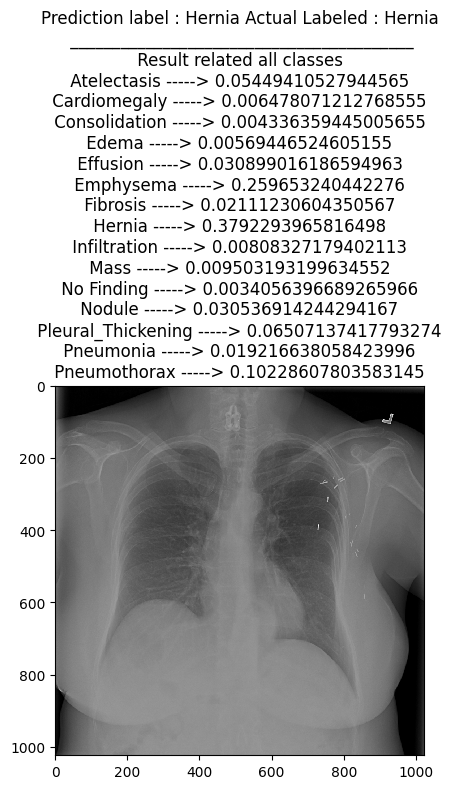

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


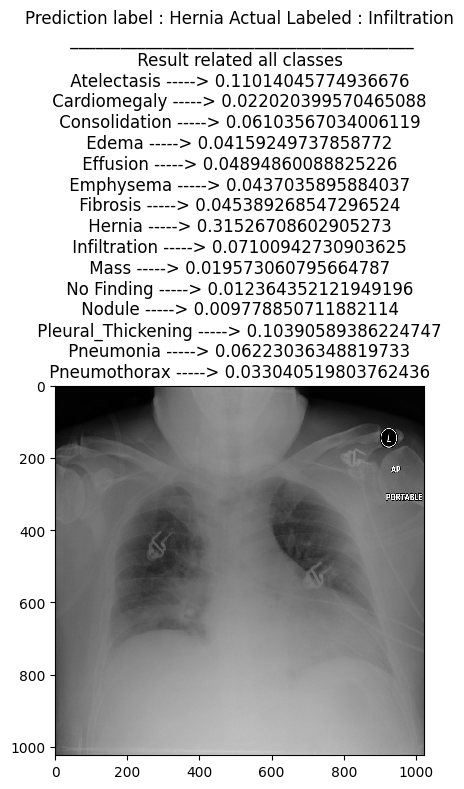

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


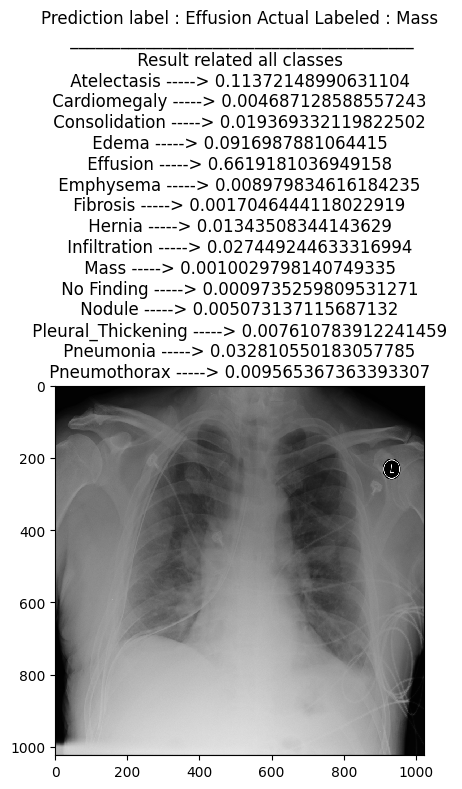

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


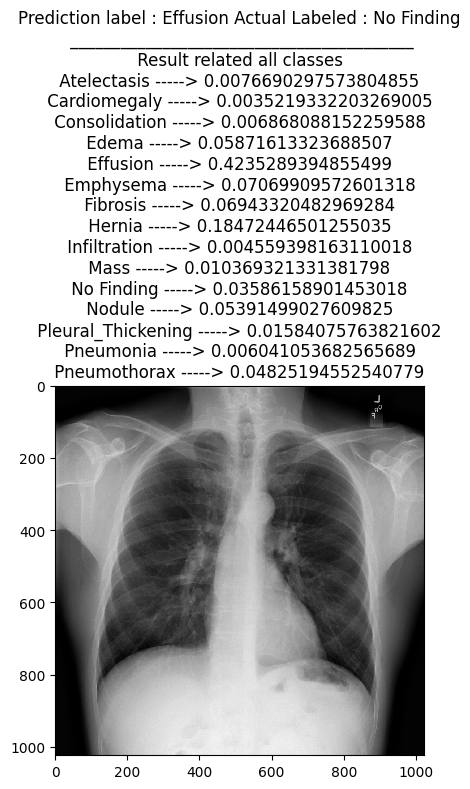

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


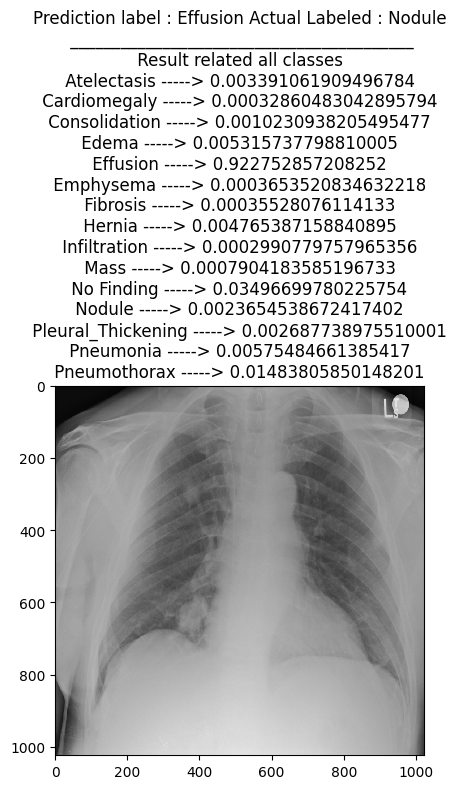

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


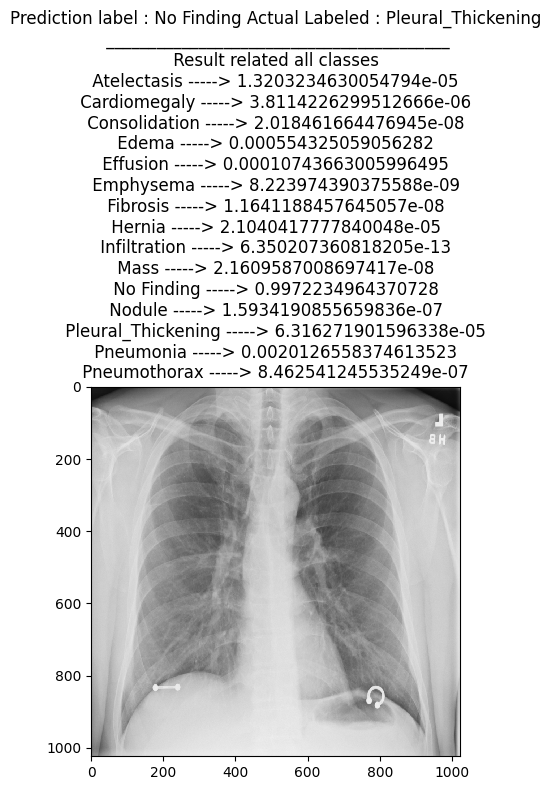

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


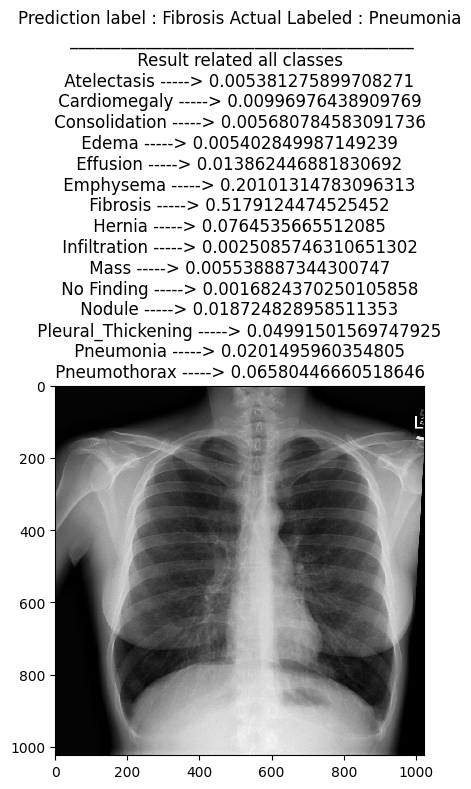

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


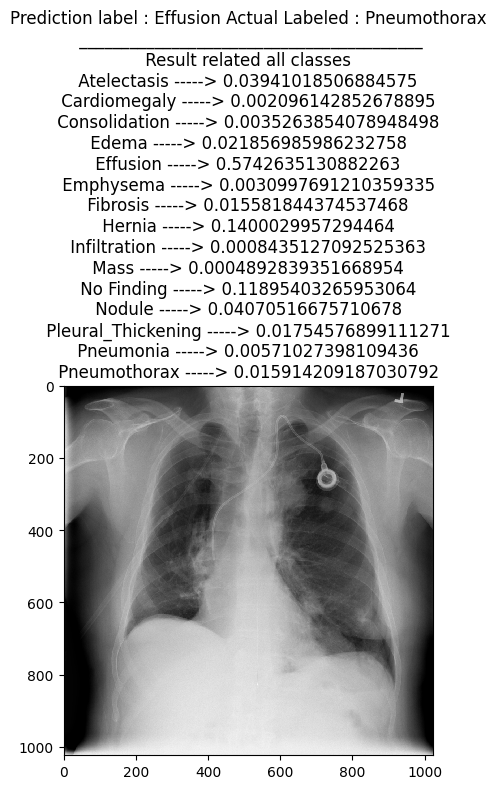

wandb: WARNING If you're specifying your api key in code, ensure this code is not shared publicly.
wandb: WARNING Consider setting the WANDB_API_KEY environment variable, or running `wandb login` from the command line.
wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc


╔═════════════════════╦═════════════════╗
║ Actual Test Label   ║ Predict Label   ║
╠═════════════════════╬═════════════════╣
║ Atelectasis         ║ Hernia          ║
║ Cardiomegaly        ║ Effusion        ║
║ Consolidation       ║ No Finding      ║
║ Edema               ║ Effusion        ║
║ Effusion            ║ Effusion        ║
║ Emphysema           ║ Hernia          ║
║ Fibrosis            ║ Hernia          ║
║ Hernia              ║ Hernia          ║
║ Infiltration        ║ Hernia          ║
║ Mass                ║ Effusion        ║
║ No Finding          ║ Effusion        ║
║ Nodule              ║ Effusion        ║
║ Pleural_Thickening  ║ No Finding      ║
║ Pneumonia           ║ Fibrosis        ║
║ Pneumothorax        ║ Effusion        ║
╚═════════════════════╩═════════════════╝
Cleaning up resources...
Cleanup error: name 'log_dir' is not defined
taining model inside details  inbalance_propose 

taining model status inbalance_propose 

---------- model compile ------------
---

wandb: wandb version 0.19.7 is available!  To upgrade, please run:
wandb:  $ pip install wandb --upgrade
wandb: Tracking run with wandb version 0.17.0
wandb: Run data is saved locally in /kaggle/working/wandb/run-20250228_081141-2dsl40qn
wandb: Run `wandb offline` to turn off syncing.
wandb: Syncing run inbalance_propose-img-size_224-100_epochs-2025-02-28-08-11-41-learning_rate-0.001-model
wandb: ⭐️ View project at https://wandb.ai/lalithk90/detection_of_thoracic_diseases_using_chest_x-ray
wandb: 🚀 View run at https://wandb.ai/lalithk90/detection_of_thoracic_diseases_using_chest_x-ray/runs/2dsl40qn


---------- model start to fit ------------


wandb: WARNING When using several event log directories, please call `wandb.tensorboard.patch(root_logdir="...")` before `wandb.init`


Epoch 1/100
1035/1036 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - accuracy: 0.1089 - dice_coefficient_multiclass: 0.0708 - loss: 3.7785 - precision: 0.1286 - recall: 0.0053

2025-02-28 08:13:14.295118: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 50399: 1.96321, expected 1.64031
2025-02-28 08:13:14.295455: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 100352: 3.50424, expected 2.84474
2025-02-28 08:13:14.295475: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 100353: 4.17972, expected 3.52022
2025-02-28 08:13:14.295485: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 100354: 5.07076, expected 4.41126
2025-02-28 08:13:14.295494: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 100355: 5.56365, expected 4.90415
2025-02-28 08:13:14.295503: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 100356: 4.49251, expected 3.83301
2025-02-28 08:13:14.295519: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 100357: 4.4737, expected 3.81421
2025-02-28 08:13:14.29

1036/1036 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - accuracy: 0.1089 - dice_coefficient_multiclass: 0.0708 - loss: 3.7785 - precision: 0.1286 - recall: 0.0053

wandb: WARNING When using several event log directories, please call `wandb.tensorboard.patch(root_logdir="...")` before `wandb.init`
2025-02-28 08:13:29.244142: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 50176: 3.99373, expected 3.33904
2025-02-28 08:13:29.244206: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 50181: 5.49764, expected 4.84295
2025-02-28 08:13:29.244216: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 50184: 4.87675, expected 4.22206
2025-02-28 08:13:29.244225: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 50186: 4.71706, expected 4.06237
2025-02-28 08:13:29.244233: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 50187: 5.04947, expected 4.39478
2025-02-28 08:13:29.244242: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 50188: 2.99866, expected 2.34397
2025-02-28 08:13:29.244250: E ex


Epoch 1: val_accuracy improved from -inf to 0.04770, saving model to propose.001.keras
1036/1036 ━━━━━━━━━━━━━━━━━━━━ 80s 64ms/step - accuracy: 0.1089 - dice_coefficient_multiclass: 0.0708 - loss: 3.7784 - precision: 0.1286 - recall: 0.0053 - val_accuracy: 0.0477 - val_dice_coefficient_multiclass: 0.0422 - val_loss: 6.9358 - val_precision: 0.0370 - val_recall: 0.0210 - learning_rate: 0.0010
Epoch 2/100
1035/1036 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - accuracy: 0.1229 - dice_coefficient_multiclass: 0.0709 - loss: 3.5804 - precision: 0.0578 - recall: 2.7796e-04
Epoch 2: val_accuracy improved from 0.04770 to 0.11049, saving model to propose.002.keras
1036/1036 ━━━━━━━━━━━━━━━━━━━━ 47s 46ms/step - accuracy: 0.1229 - dice_coefficient_multiclass: 0.0709 - loss: 3.5803 - precision: 0.0579 - recall: 2.7794e-04 - val_accuracy: 0.1105 - val_dice_coefficient_multiclass: 0.0695 - val_loss: 3.5781 - val_precision: 0.0227 - val_recall: 1.2076e-04 - learning_rate: 0.0010
Epoch 3/100
1035/1036 ━━━━━━━━━

wandb:                                                                                
wandb: 
wandb: Run history:
wandb:                                                     global_step ▁▁▁▁▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇████
wandb:                                            train/epoch_accuracy ▁▂▂▂▃▃▄▃▄▄▄▄▄▅▅▅▅▅▆▇▇▇▇▇▇█████
wandb:                         train/epoch_dice_coefficient_multiclass ▁▁▂▁▂▂▂▂▂▃▃▃▃▄▄▄▅▅▅▆▆▆▇▇▇█████
wandb:                                       train/epoch_learning_rate ██████████████████▂▂▂▂▂▂▂▁▁▁▁▁
wandb:                                                train/epoch_loss █▆▅▅▅▅▄▄▄▄▄▄▄▃▄▃▃▃▂▂▂▂▂▂▁▁▁▁▁▁
wandb:                                           train/epoch_precision ▁▁▃▃▄▅▅▅▆▆▇▆▇▆▇█▇▇███▇█▇██████
wandb:                                              train/epoch_recall ▂▁▁▁▁▁▁▁▁▂▂▂▂▂▃▃▃▃▄▅▅▆▆▆▇▇▇▇██
wandb:                                               train/global_step ▁▁▁▁▁▂▂▂▂▃▃▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▇▇▇▇▇▇███
wandb:                                       vali

---------- call model training history visualization ------------


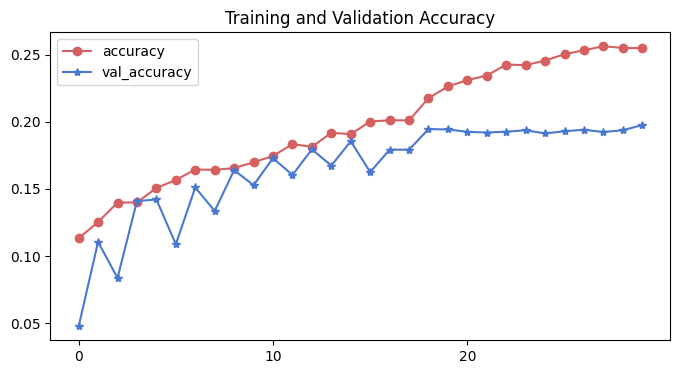

<Figure size 640x480 with 0 Axes>

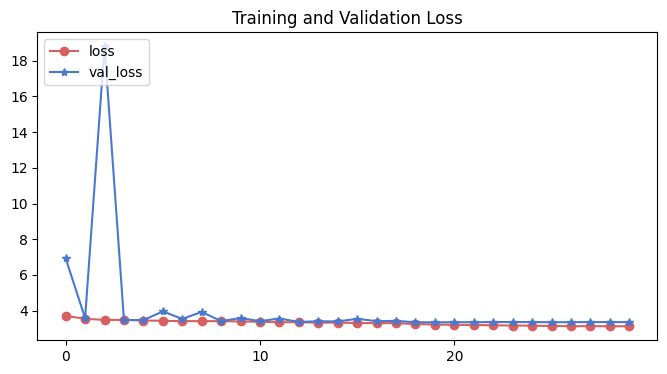

<Figure size 640x480 with 0 Axes>

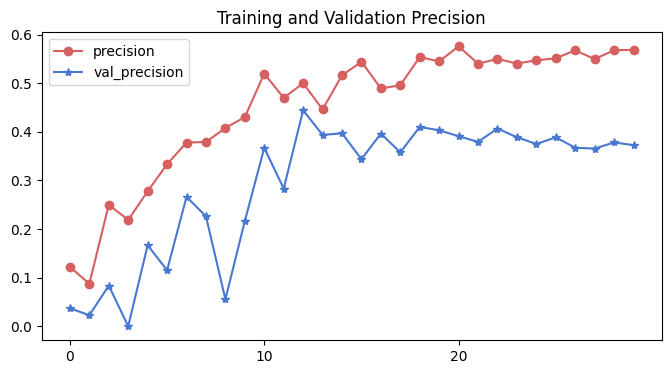

<Figure size 640x480 with 0 Axes>

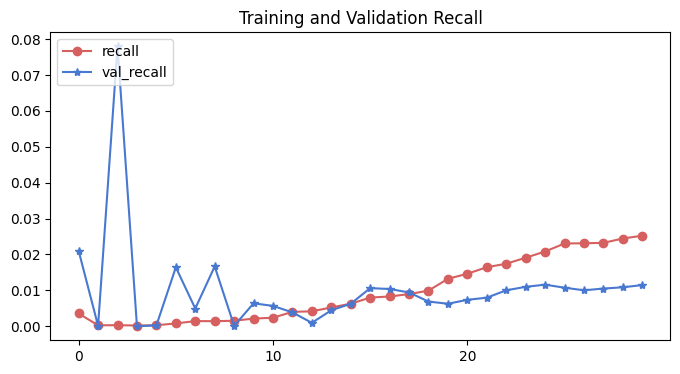

<Figure size 640x480 with 0 Axes>

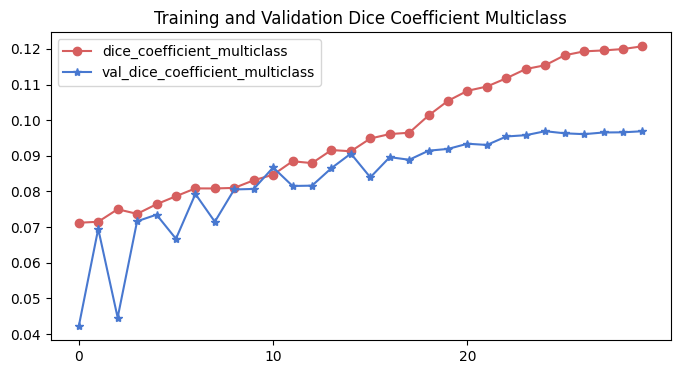

<Figure size 640x480 with 0 Axes>

---------- end model training history visualization ------------
---------- call model validation ------------
-----------start to call some validation ------------
259/259 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.1870 - dice_coefficient_multiclass: 0.0910 - loss: 3.3606 - precision: 0.3693 - recall: 0.0061
inbalance_propose-img-size_224-100_epochs-2025-02-28-08-11-41-learning_rate-0.001-model
╔═════════════╦═════════════════╦════════════════╦════════════════════╗
║   Test loss ║   Test accuracy ║   Test loss(%) ║   Test accuracy(%) ║
╠═════════════╬═════════════════╬════════════════╬════════════════════╣
║     3.34119 ║          0.1943 ║        334.119 ║              19.43 ║
╚═════════════╩═════════════════╩════════════════╩════════════════════╝
259/259 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step


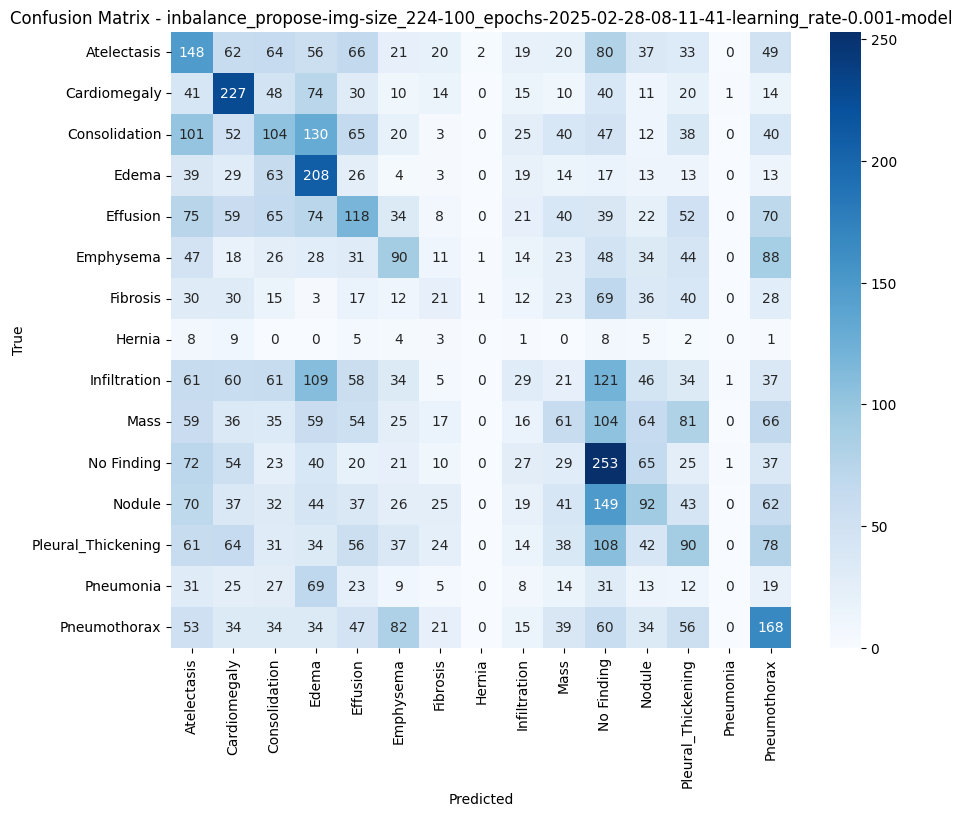

inbalance_propose-img-size_224-100_epochs-2025-02-28-08-11-41-learning_rate-0.001-model Sensitivities
╔════════════════════╦═════════════════╗
║ Label              ║   Sensitivities ║
╠════════════════════╬═════════════════╣
║ Atelectasis        ║       0.218612  ║
║ Cardiomegaly       ║       0.409009  ║
║ Consolidation      ║       0.153619  ║
║ Edema              ║       0.451193  ║
║ Effusion           ║       0.174298  ║
║ Emphysema          ║       0.178926  ║
║ Fibrosis           ║       0.0623145 ║
║ Hernia             ║       0         ║
║ Infiltration       ║       0.042836  ║
║ Mass               ║       0.0901034 ║
║ No Finding         ║       0.373708  ║
║ Nodule             ║       0.135894  ║
║ Pleural_Thickening ║       0.132939  ║
║ Pneumonia          ║       0         ║
║ Pneumothorax       ║       0.248154  ║
╚════════════════════╩═════════════════╝
╔═════════════════════╦═════════════════════════════╗
║   Modal Sensitivity ║   Modal Average Sensitivity ║
╠══════════

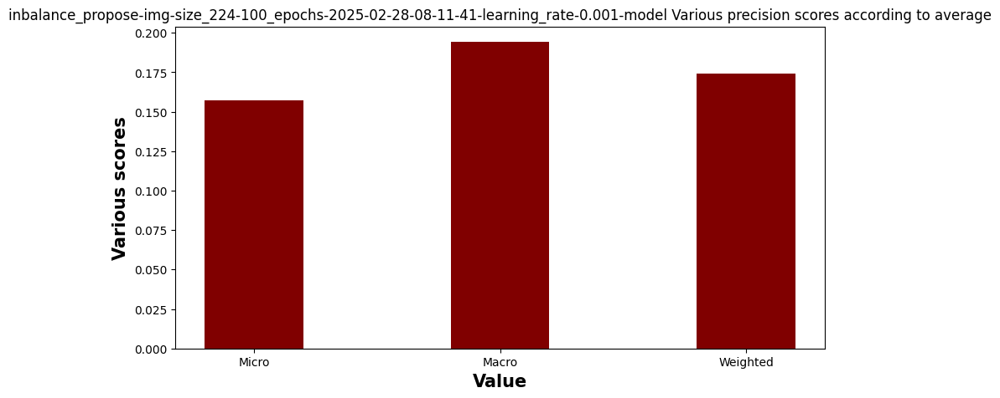

inbalance_propose-img-size_224-100_epochs-2025-02-28-08-11-41-learning_rate-0.001-model Recall score 

╔════════════════════╦════════════════╗
║ Label              ║   Recall score ║
╠════════════════════╬════════════════╣
║ Atelectasis        ║      0.218612  ║
║ Cardiomegaly       ║      0.409009  ║
║ Consolidation      ║      0.153619  ║
║ Edema              ║      0.451193  ║
║ Effusion           ║      0.174298  ║
║ Emphysema          ║      0.178926  ║
║ Fibrosis           ║      0.0623145 ║
║ Hernia             ║      0         ║
║ Infiltration       ║      0.042836  ║
║ Mass               ║      0.0901034 ║
║ No Finding         ║      0.373708  ║
║ Nodule             ║      0.135894  ║
║ Pleural_Thickening ║      0.132939  ║
║ Pneumonia          ║      0         ║
║ Pneumothorax       ║      0.248154  ║
╚════════════════════╩════════════════╝
╔══════════════════════╦══════════════════════╦═════════════════════════╗
║   Recall score macro ║   Recall score micro ║   Recall score 

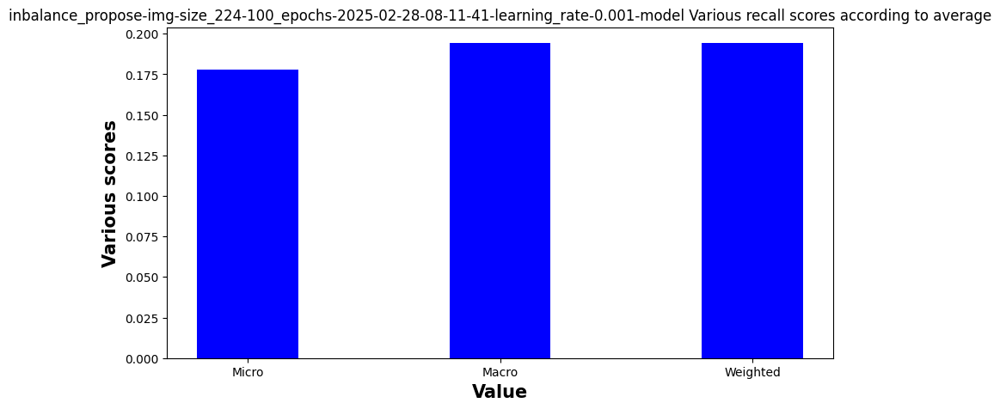

inbalance_propose-img-size_224-100_epochs-2025-02-28-08-11-41-learning_rate-0.001-model F1 score 

╔════════════════════╦════════════╗
║ Label              ║   F1 score ║
╠════════════════════╬════════════╣
║ Atelectasis        ║  0.188175  ║
║ Cardiomegaly       ║  0.336047  ║
║ Consolidation      ║  0.159387  ║
║ Edema              ║  0.29234   ║
║ Effusion           ║  0.177444  ║
║ Emphysema          ║  0.193133  ║
║ Fibrosis           ║  0.0796964 ║
║ Hernia             ║  0         ║
║ Infiltration       ║  0.0622986 ║
║ Mass               ║  0.111927  ║
║ No Finding         ║  0.273366  ║
║ Nodule             ║  0.152951  ║
║ Pleural_Thickening ║  0.142857  ║
║ Pneumonia          ║  0         ║
║ Pneumothorax       ║  0.232205  ║
╚════════════════════╩════════════╝
╔══════════════════╦══════════════════╦═════════════════════╗
║   F1 score macro ║   F1 score micro ║   F1 score weighted ║
╠══════════════════╬══════════════════╬═════════════════════╣
║         0.160122 ║           

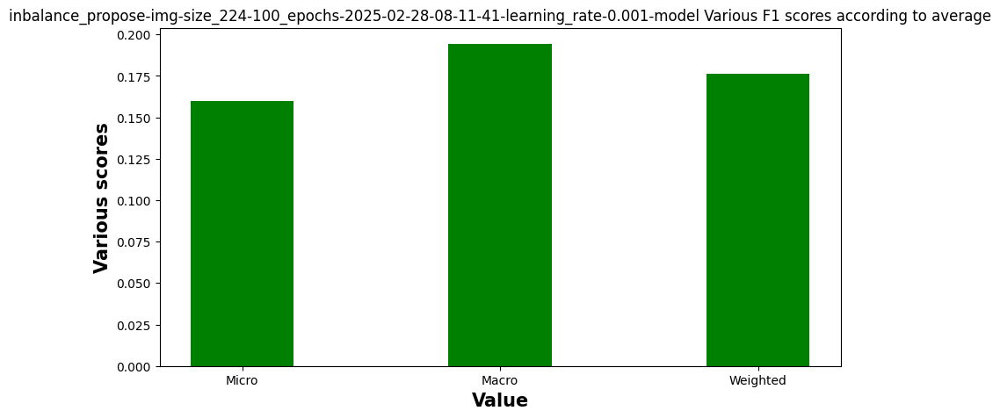

Classification Report : inbalance_propose-img-size_224-100_epochs-2025-02-28-08-11-41-learning_rate-0.001-model
--- Trainned model data - inbalance_propose-img-size_224-100_epochs-2025-02-28-08-11-41-learning_rate-0.001-model ---
The model is trained.
Name : input_layer, 	 	 | Shape :  None
Name : conv2d, 	 	 | Shape :  InputSpec(min_ndim=4, axes={-1: 3})
Name : batch_normalization, 	 	 | Shape :  InputSpec(ndim=4, axes={-1: 16})
Name : conv2d_1, 	 	 | Shape :  InputSpec(min_ndim=4, axes={-1: 16})
Name : batch_normalization_1, 	 	 | Shape :  InputSpec(ndim=4, axes={-1: 16})
Name : max_pooling2d, 	 	 | Shape :  InputSpec(ndim=4)
Name : dropout, 	 	 | Shape :  None
Name : conv2d_2, 	 	 | Shape :  InputSpec(min_ndim=4, axes={-1: 16})
Name : batch_normalization_2, 	 	 | Shape :  InputSpec(ndim=4, axes={-1: 32})
Name : conv2d_3, 	 	 | Shape :  InputSpec(min_ndim=4, axes={-1: 32})
Name : batch_normalization_3, 	 	 | Shape :  InputSpec(ndim=4, axes={-1: 32})
Name : max_pooling2d_1, 	 	 | Shap

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d (Conv2D)                 │ (None, 224, 224, 16)   │           448 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 224, 224, 16)   │            64 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 224, 224, 16)   │         2,320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 224, 224, 16)   │            64 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 112, 112, 16)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 112, 112, 16)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 112, 112, 32)   │         4,640 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 112, 112, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 112, 112, 32)   │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (None, 112, 112, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 56, 56, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 56, 56, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 56, 56, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_4           │ (None, 56, 56, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (None, 56, 56, 64)     │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_5           │ (None, 56, 56, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 28, 28, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 28, 28, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 50176)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 256)            │    12,845,312 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_6           │ (None, 256)            │         1,02

 Total params: 38,767,583 (147.89 MB)

 Trainable params: 12,922,207 (49.29 MB)

 Non-trainable params: 960 (3.75 KB)

 Optimizer params: 25,844,416 (98.59 MB)

╔══════════════╦═════════════════╦══════════════════════════════════════════════════╦══════════════╦════════════════╦═══════════════╗
║   Image size ║   Learning rate ║ Wandb project name                               ║   Batch size ║   Epochs count ║   Num classes ║
╠══════════════╬═════════════════╬══════════════════════════════════════════════════╬══════════════╬════════════════╬═══════════════╣
║          224 ║           0.001 ║ detection_of_thoracic_diseases_using_chest_x-ray ║           32 ║            100 ║            15 ║
╚══════════════╩═════════════════╩══════════════════════════════════════════════════╩══════════════╩════════════════╩═══════════════╝
---------- call model prediction ------------
prediction related to  inbalance_propose-img-size_224-100_epochs-2025-02-28-08-11-41-learning_rate-0.001-model
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 405ms/step


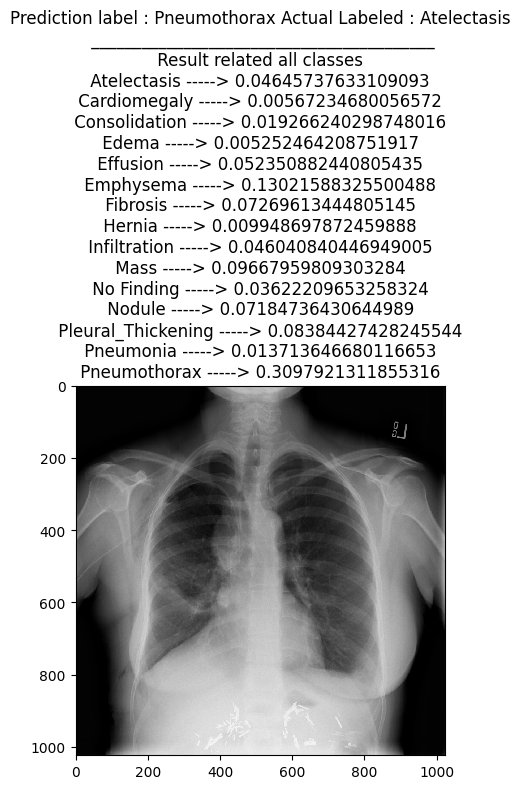

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


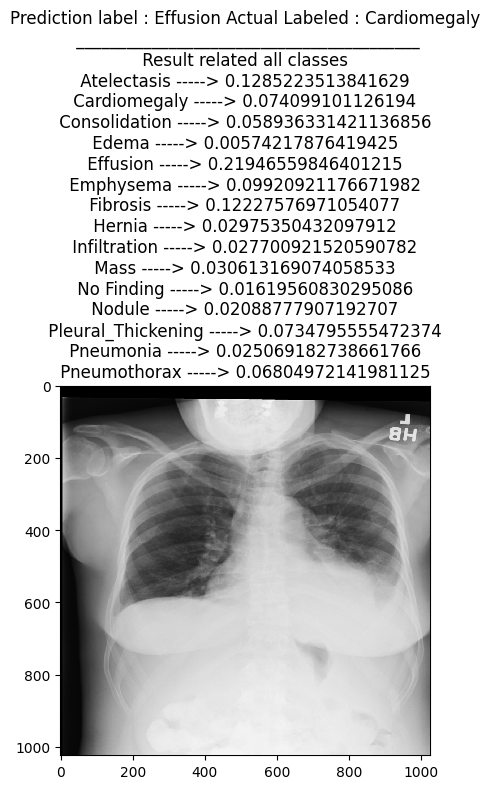

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


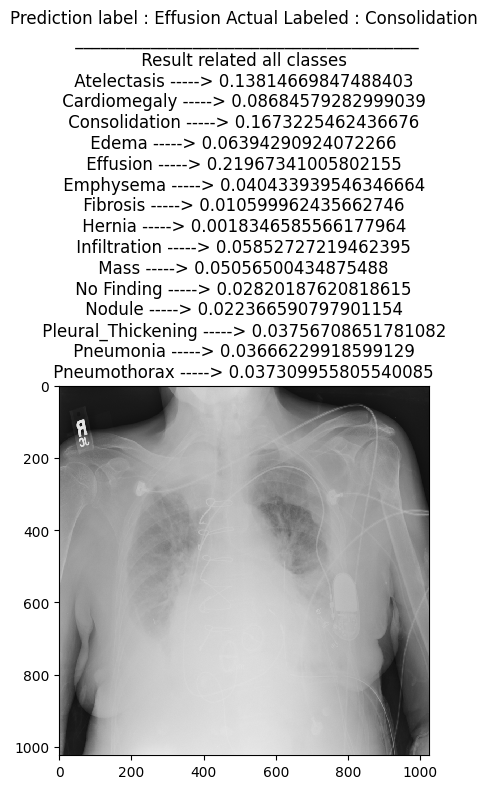

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


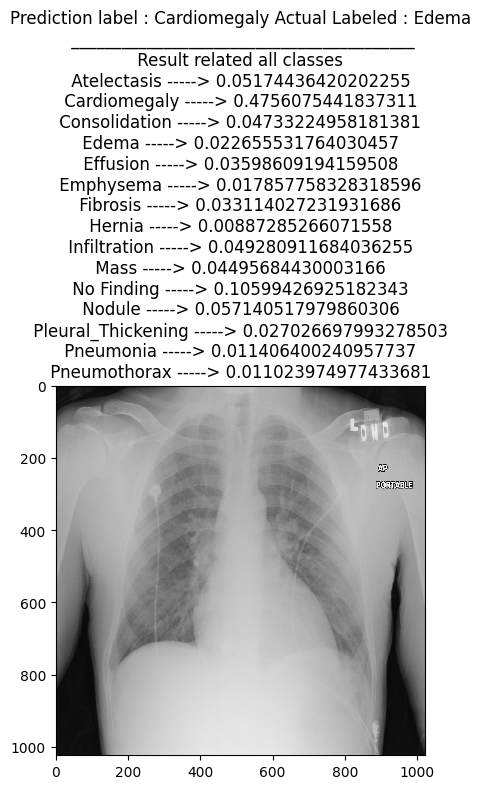

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


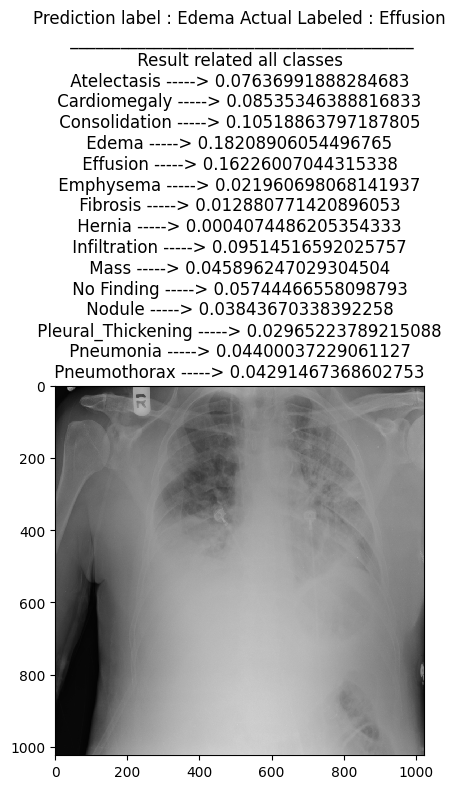

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


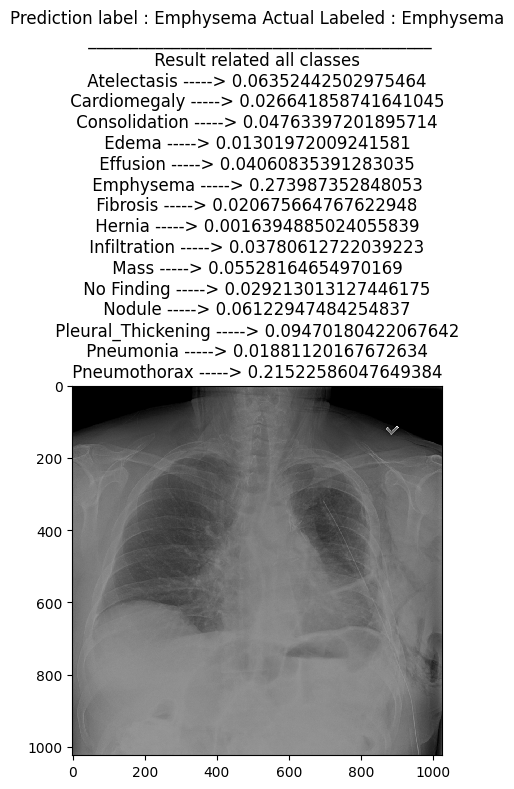

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


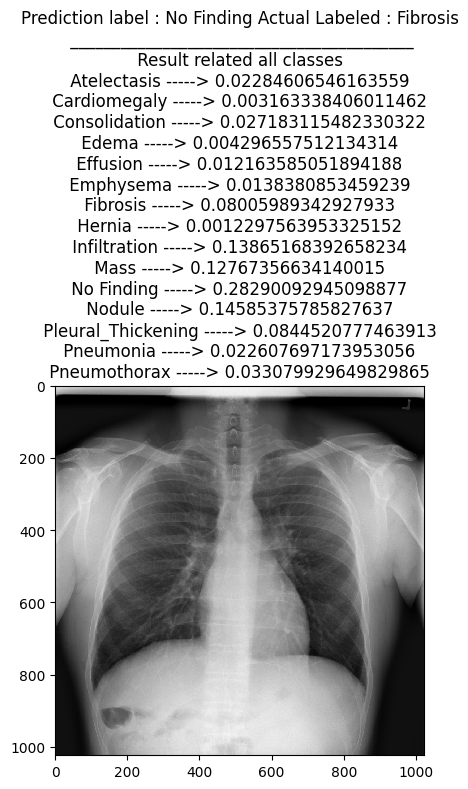

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


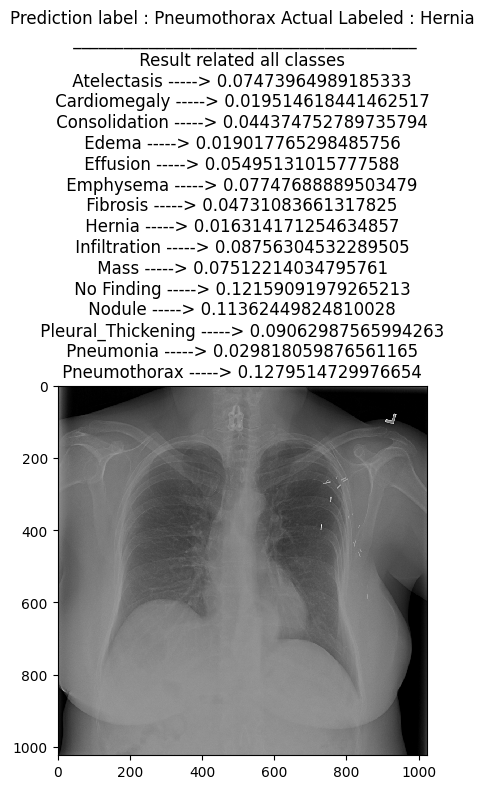

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


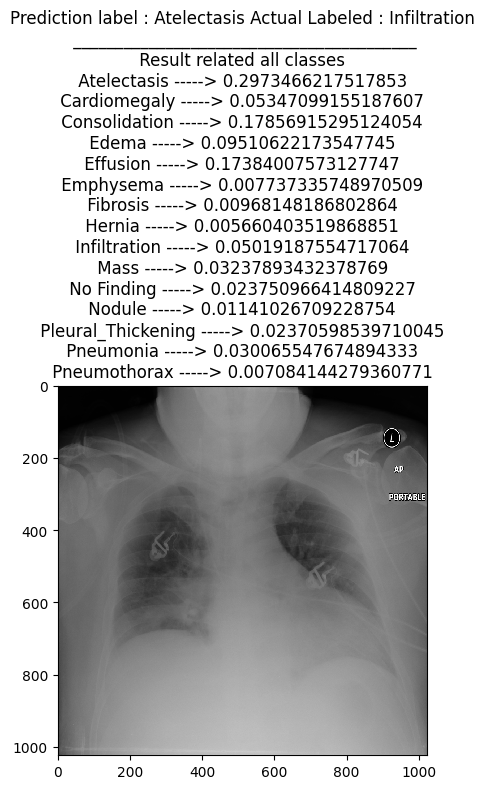

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


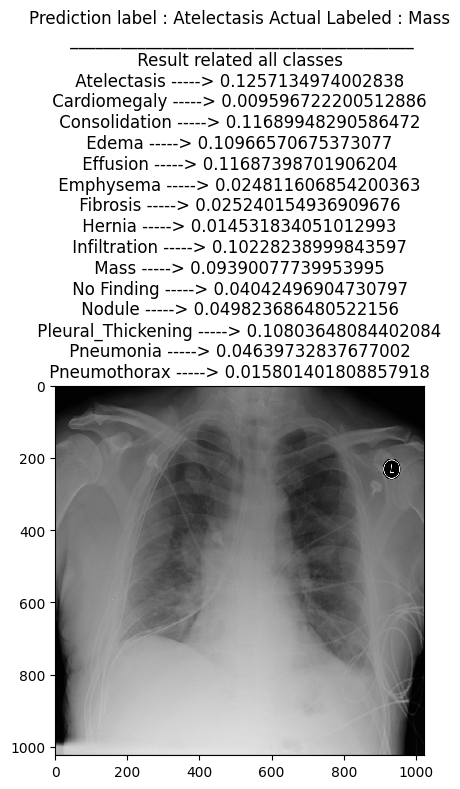

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


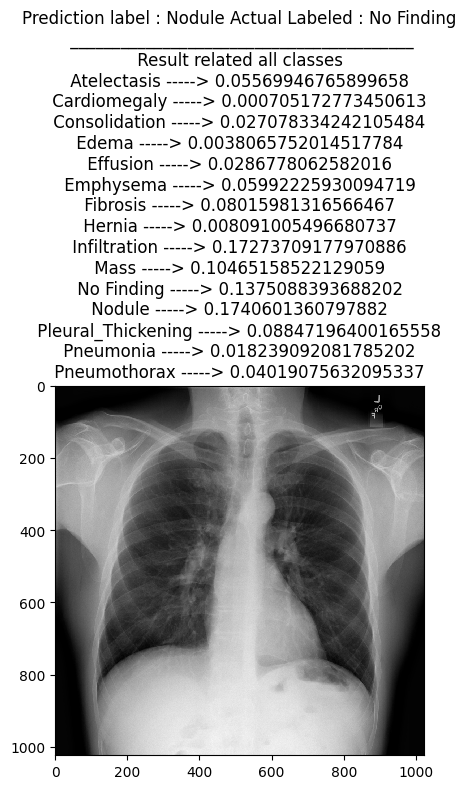

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


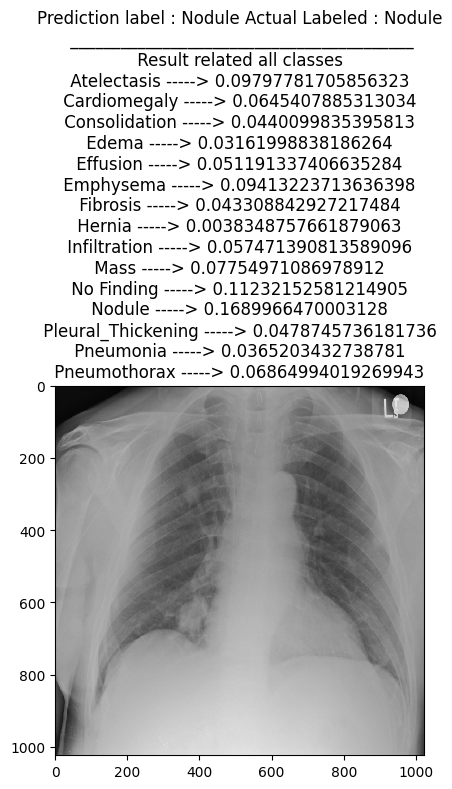

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


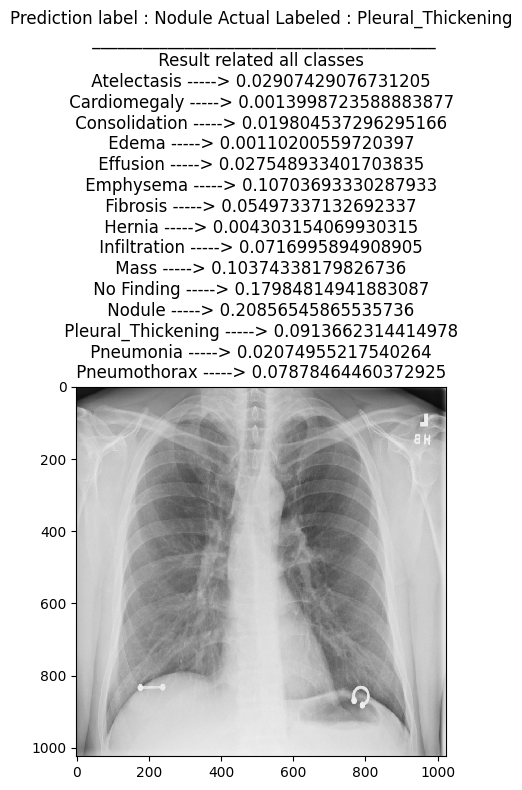

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


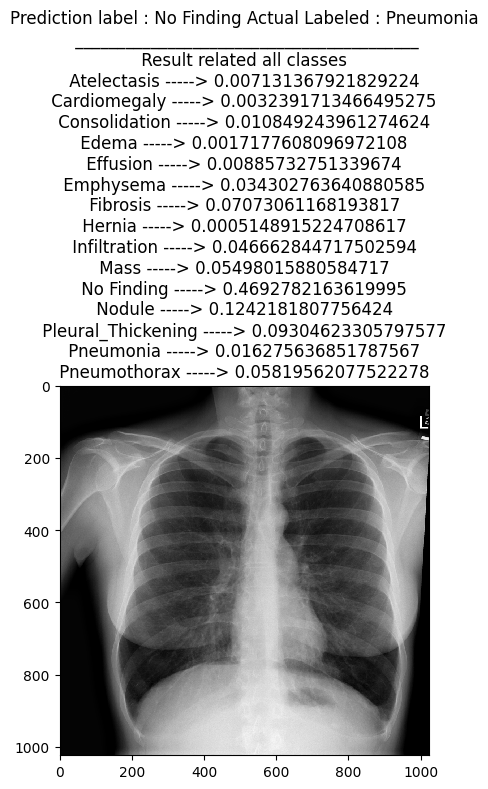

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


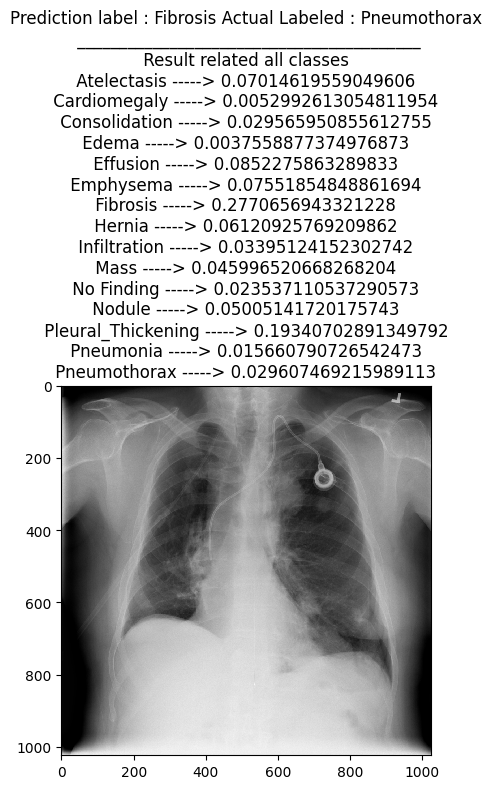

╔═════════════════════╦═════════════════╗
║ Actual Test Label   ║ Predict Label   ║
╠═════════════════════╬═════════════════╣
║ Atelectasis         ║ Pneumothorax    ║
║ Cardiomegaly        ║ Effusion        ║
║ Consolidation       ║ Effusion        ║
║ Edema               ║ Cardiomegaly    ║
║ Effusion            ║ Edema           ║
║ Emphysema           ║ Emphysema       ║
║ Fibrosis            ║ No Finding      ║
║ Hernia              ║ Pneumothorax    ║
║ Infiltration        ║ Atelectasis     ║
║ Mass                ║ Atelectasis     ║
║ No Finding          ║ Nodule          ║
║ Nodule              ║ Nodule          ║
║ Pleural_Thickening  ║ Nodule          ║
║ Pneumonia           ║ No Finding      ║
║ Pneumothorax        ║ Fibrosis        ║
╚═════════════════════╩═════════════════╝
Cleaning up resources...
Cleanup error: name 'log_dir' is not defined


In [34]:
from tensorflow.keras.layers import Input, Conv2D, BatchNormalization, Activation, MaxPooling2D, GlobalAveragePooling2D, Dense, Dropout, RandomFlip, RandomRotation, Rescaling

# model = keras.Sequential([
#         layers.Input(shape=(image_size, image_size, 3)),
        
#         # Block 1
#         layers.Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same'),
#         layers.BatchNormalization(),
#         layers.Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same'),
#         layers.BatchNormalization(),
#         layers.MaxPooling2D((2, 2)),
#         layers.Dropout(0.25),
        
#         # Block 2
#         layers.Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same'),
#         layers.BatchNormalization(),
#         layers.Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same'),
#         layers.BatchNormalization(),
#         layers.MaxPooling2D((2, 2)),
#         layers.Dropout(0.25),
        
#         # Block 3
#         layers.Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same'),
#         layers.BatchNormalization(),
#         layers.Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same'),
#         layers.BatchNormalization(),
#         layers.MaxPooling2D((2, 2)),
#         layers.Dropout(0.25),
        
#         # Classification head
#         layers.Flatten(),
#         layers.Dense(512, activation='relu', kernel_initializer='he_normal'),
#         layers.BatchNormalization(),
#         layers.Dropout(0.5),
#         layers.Dense(num_classes, activation='softmax')
#     ])

inputs = keras.Input(shape=(image_size, image_size, 3))
    
    # Block 1
x = layers.Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(inputs)
x = layers.BatchNormalization()(x)
x = layers.Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(x)
x = layers.BatchNormalization()(x)
x = layers.MaxPooling2D((2, 2))(x)
x = layers.Dropout(0.2)(x)
    
    # Block 2
x = layers.Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(x)
x = layers.BatchNormalization()(x)
x = layers.Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(x)
x = layers.BatchNormalization()(x)
x = layers.MaxPooling2D((2, 2))(x)
x = layers.Dropout(0.3)(x)
    
    # Block 3
x = layers.Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(x)
x = layers.BatchNormalization()(x)
x = layers.Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(x)
x = layers.BatchNormalization()(x)
x = layers.MaxPooling2D((2, 2))(x)
x = layers.Dropout(0.4)(x)

    
    # Classification head
x = layers.Flatten()(x)
x = layers.Dense(256, activation='relu', kernel_initializer='he_normal')(x)
x = layers.BatchNormalization()(x)
x = layers.Dropout(0.5)(x)
outputs = layers.Dense(num_classes, activation='softmax')(x)
    
model = keras.Model(inputs, outputs)

model_training_validation(model,'balance_propose',X_train_balance, y_train_balance, X_val_balance, y_val_balance)
model_training_validation(model,'inbalance_propose',X_train_inbalance, y_train_inbalance, X_val_inbalance, y_val_inbalance)

In [35]:
# import tensorflow as tf
# from tensorflow.keras.models import Model
# from tensorflow.keras.layers import Dense, Flatten, Dropout
# from tensorflow.keras.applications import ResNet50

# def build_resnet50_model(input_shape=(224, 224, 3), num_classes=15):
#     # Load Pretrained ResNet-50 Model (without top layer)
#     base_model = ResNet50(weights="imagenet", include_top=False, input_shape=input_shape)
    
#     # Freeze the base model layers
#     base_model.trainable = False

#     # Add Custom Layers
#     x = Flatten()(base_model.output)
#     x = Dense(512, activation="relu")(x)
#     x = Dropout(0.5)(x)
#     x = Dense(num_classes, activation="softmax")(x)
    
#     return Model(inputs=base_model.input, outputs=x)

# # Build the model
# model = build_resnet50_model()

# model_training_validation(model,'balance_restnet50',X_train_balance, y_train_balance, X_val_balance, y_val_balance)
# model_training_validation(model,'inbalance_restnet50',X_train_inbalance, y_train_inbalance, X_val_inbalance, y_val_inbalance)